#### Benchmaking Experiment 006b
- benchmarking model architecture -3 with PAMAP2, DaLiAc and UTD-MHAD datasets
- Model : Model4
- Dataset : PAMAP2
- Semantic Space : Glove50
- Cross Validation : 5-fold fixed classes
- Feature Loss : MSELoss

In [1]:
import os 
from datetime import date
from tqdm import tqdm
from copy import deepcopy
import numpy as np 
import pandas as pd
import json

import torch 
from torch import nn, Tensor
from torch.nn import functional as F
from torch.nn.modules import MultiheadAttention, Linear, Dropout, BatchNorm1d, TransformerEncoderLayer
from torch.utils.data import Dataset, DataLoader
from torch.optim import Adam
from torch.nn import MSELoss

import numpy.random as random
from src.datasets.data import PAMAP2ReaderV2
from src.datasets.dataset import PAMAP2Dataset
from src.utils.analysis import action_evaluator
from src.datasets.utils import load_attribute

from src.models.loss import FeatureLoss, AttributeLoss

# from src.running import train_step1, eval_step1

In [2]:
# setup model configurations
config = {
    # general information
    "experiment-name": "test-001", 
    "datetime": date.today(),
    "device": "gpu",
    "dataset": "PAMAP2",
    "Model": "SOTAEmbedding",
    "model_params":{
        "linear_filters":[1024,1024,1024,400],
        "input_feat":36,
        "dropout":0.1,
    },
    "folding": True,
    "lr": 0.0001,
    "n_epochs": 15,
    "optimizer": "adam",
    "batch_size": 64,
    "seen_split": 0.2,
    "unseen_split": 0.8
}

In [3]:
def save_model(model,model_name,unique_name,fold_id):
    PATH = f"{models_saves}/{model_name}"
    os.makedirs(PATH,exist_ok=True)
    torch.save({
        "n_epochs" : config["n_epochs"],
        "model_state_dict":model.state_dict(),
        "config": config
    }, f"{PATH}/{unique_name}_{fold_id}.pt")

model_iden = "fold"
notebook_iden = "SORTModel_Pse3D_400"
models_saves = "model_saves"

In [4]:
dataReader = PAMAP2ReaderV2('data/PAMAP2_Dataset/Protocol/')
actionList = dataReader.idToLabel

Reading file 1 of 14
Reading file 2 of 14
Reading file 3 of 14
Reading file 4 of 14
Reading file 5 of 14
Reading file 6 of 14
Reading file 7 of 14
Reading file 8 of 14
Reading file 9 of 14
Reading file 10 of 14
Reading file 11 of 14
Reading file 12 of 14
Reading file 13 of 14
Reading file 14 of 14


D:\FYP\HAR-ZSL-XAI\src\datasets\data.py:525: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  return np.asarray(data), np.asarray(labels, dtype=int), np.array(collection)


[ 1  2  3  4  5  6  7  9 10 11 12 13 16 17 18 19 20 24]
[ 0  1  2  3  4  5  6  7  8  9 10 11 12 13 14 15 16 17]


Model Building

In [5]:
class SOTAEmbedding(nn.Module):
    def __init__(self, linear_filters=[1024,1024,1024,2048],input_feat=102, dropout=0.1):
        super(SOTAEmbedding, self).__init__()
        self.input_feat = input_feat
        self.linear_filters = linear_filters
        self.input_feat = input_feat
        self.dropout = dropout

        self.linear1 = nn.Linear(input_feat,linear_filters[0])
        self.batch_norm1 = nn.BatchNorm1d(linear_filters[0])
        self.linear2 = nn.Linear(linear_filters[0],linear_filters[1])
        self.batch_norm2 = nn.BatchNorm1d(linear_filters[1])
        self.linear3 = nn.Linear(linear_filters[1],linear_filters[2])
        self.batch_norm3 = nn.BatchNorm1d(linear_filters[2])
        self.linear4 = nn.Linear(linear_filters[2]+linear_filters[1]+linear_filters[0],linear_filters[3])
        self.batch_norm4 = nn.BatchNorm1d(linear_filters[3])
        self.act = F.relu



    def forward(self, x):
        #layer1
        out1 = self.linear1(x)
        out1 = self.batch_norm1(out1)
        out1 = self.act(out1)

        #layer2
        out2 = self.linear2(out1)
        out2 = self.batch_norm2(out2)
        out2 = self.act(out2)

        #layer3
        out3 = self.linear3(out2)
        out3 = self.batch_norm3(out3)
        out3 = self.act(out3)

        concat = torch.cat([out1,out2,out3],-1)

        #layer4
        out4 = self.linear4(concat)
        out4 = self.batch_norm4(out4)
        out4 = self.act(out4)
        return out4

In [6]:
model = SOTAEmbedding(
    linear_filters=config["model_params"]["linear_filters"],
    input_feat=config["model_params"]["input_feat"],
    dropout=config["model_params"]["dropout"]
)

In [7]:
emb = model(torch.randn((32,36)))
emb.size()

torch.Size([32, 400])

In [8]:
emb

tensor([[1.6130, 0.0000, 0.0000,  ..., 0.9836, 2.2915, 0.1245],
        [0.0000, 0.0000, 0.2143,  ..., 0.6074, 0.1339, 0.0000],
        [0.0000, 0.0000, 0.4712,  ..., 1.1678, 0.0000, 0.0000],
        ...,
        [0.0000, 0.0000, 0.2049,  ..., 0.0000, 0.3954, 0.0000],
        [0.8468, 0.5507, 0.6062,  ..., 1.0882, 1.8853, 0.6942],
        [0.6301, 0.0000, 0.0000,  ..., 0.6768, 0.7783, 1.2267]],
       grad_fn=<ReluBackward0>)

---

In [9]:
from sklearn.metrics import accuracy_score
from sklearn.metrics.pairwise import cosine_similarity

---

In [10]:
if config['device'] == 'cpu':
    device = "cpu"
else:
    device = torch.device("cuda:0" if torch.cuda.is_available() else "cpu")

In [11]:
dataReader.data.shape

(124,)

In [12]:
# run 5-fold running
fold_classes = [['watching TV', 'house cleaning', 'standing', 'ascending stairs'], ['walking', 'rope jumping', 'sitting', 'descending stairs'], ['playing soccer', 'lying', 'vacuum cleaning', 'computer work'], ['cycling', 'running', 'Nordic walking'], ['ironing', 'car driving', 'folding laundry']]

fold_cls_ids = [[actionList.index(i) for i in j] for j in fold_classes]

In [13]:
dts = PAMAP2Dataset

In [14]:
import pickle

with open("E:\\FYP_Data\\Pose3D\\output_prototypes.pkl","rb") as f0:
    prototype_map = pickle.load(f0)

In [15]:
video_data = prototype_map
video_classes, video_feat = np.asarray(list(prototype_map.keys())), np.asarray(list(prototype_map.values()))

In [16]:
video_feat.shape,list(prototype_map.keys())

((18, 400),
 ['Nordic walking',
  'ascending stairs',
  'car driving',
  'computer work',
  'cycling',
  'descending stairs',
  'folding laundry',
  'house cleaning',
  'ironing',
  'lying',
  'playing soccer',
  'rope jumping',
  'running',
  'sitting',
  'standing',
  'vacuum cleaning',
  'walking',
  'watching TV'])

In [17]:
video_classes,len(np.unique(video_classes))

(array(['Nordic walking', 'ascending stairs', 'car driving',
        'computer work', 'cycling', 'descending stairs', 'folding laundry',
        'house cleaning', 'ironing', 'lying', 'playing soccer',
        'rope jumping', 'running', 'sitting', 'standing',
        'vacuum cleaning', 'walking', 'watching TV'], dtype='<U17'),
 18)

In [18]:
vid_cls_name = np.unique(video_classes)

In [19]:
def selecting_video_prototypes(prototypes:np.array,classes:np.array,vid_class_name:np.array):
    selected = []
    for tar in vid_class_name:
        indexes = np.where(classes == tar)
        selected.append(torch.from_numpy(prototypes[random.choice(indexes[0])]))

    return torch.stack(selected)

In [20]:
selecting_video_prototypes(video_feat,video_classes,vid_cls_name).shape

torch.Size([18, 400])

In [21]:
dataReader.label_map

[(1, 'lying'),
 (2, 'sitting'),
 (3, 'standing'),
 (4, 'walking'),
 (5, 'running'),
 (6, 'cycling'),
 (7, 'Nordic walking'),
 (9, 'watching TV'),
 (10, 'computer work'),
 (11, 'car driving'),
 (12, 'ascending stairs'),
 (13, 'descending stairs'),
 (16, 'vacuum cleaning'),
 (17, 'ironing'),
 (18, 'folding laundry'),
 (19, 'house cleaning'),
 (20, 'playing soccer'),
 (24, 'rope jumping')]

In [22]:
np.unique(video_classes)

array(['Nordic walking', 'ascending stairs', 'car driving',
       'computer work', 'cycling', 'descending stairs', 'folding laundry',
       'house cleaning', 'ironing', 'lying', 'playing soccer',
       'rope jumping', 'running', 'sitting', 'standing',
       'vacuum cleaning', 'walking', 'watching TV'], dtype='<U17')

In [23]:
from collections import defaultdict

label2Id = {c[1]:i for i,c in enumerate(dataReader.label_map)}
action_dict = defaultdict(list)
skeleton_Ids = []
for i, a in enumerate(video_classes):
    action_dict[label2Id[a]].append(i)
    skeleton_Ids.append(label2Id[a])

In [24]:
action_dict

defaultdict(list,
            {6: [0],
             10: [1],
             9: [2],
             8: [3],
             5: [4],
             11: [5],
             14: [6],
             15: [7],
             13: [8],
             0: [9],
             16: [10],
             17: [11],
             4: [12],
             1: [13],
             2: [14],
             12: [15],
             3: [16],
             7: [17]})

In [25]:
data_dict = dataReader.generate(unseen_classes=fold_cls_ids[0], seen_ratio=0.2, unseen_ratio=0.8, window_size=5.21, window_overlap=4.21, resample_freq=20)

per class count :  {'lying': 8, 'sitting': 8, 'standing': 8, 'walking': 8, 'running': 6, 'cycling': 7, 'Nordic walking': 7, 'watching TV': 1, 'computer work': 4, 'car driving': 1, 'ascending stairs': 16, 'descending stairs': 17, 'vacuum cleaning': 8, 'ironing': 8, 'folding laundry': 4, 'house cleaning': 5, 'playing soccer': 2, 'rope jumping': 6}
<class 'list'> <class 'list'> <class 'numpy.ndarray'> <class 'numpy.ndarray'>


In [26]:
data_dict['train']['X'].shape,data_dict['train']['y'].shape

((16752, 36), (16752,))

In [27]:
action_dict

defaultdict(list,
            {6: [0],
             10: [1],
             9: [2],
             8: [3],
             5: [4],
             11: [5],
             14: [6],
             15: [7],
             13: [8],
             0: [9],
             16: [10],
             17: [11],
             4: [12],
             1: [13],
             2: [14],
             12: [15],
             3: [16],
             7: [17]})

In [28]:
data_dict['seen_classes']

[0, 1, 3, 4, 5, 6, 8, 9, 11, 12, 13, 14, 16, 17]

In [29]:
sample_dt = PAMAP2Dataset(data=data_dict['train']['X'], actions=data_dict['train']['y'], attributes=video_feat, attribute_dict=action_dict, action_classes=data_dict['seen_classes'], seq_len=100)
sample_dl = DataLoader(sample_dt, batch_size=32, shuffle=True, pin_memory=True, drop_last=True)
for d in sample_dl:
    print(100*np.isinf(d[0].numpy()).sum()/(d[0].shape[0]*d[0].shape[1]))

0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0


In [30]:
sample_dt.action2Id

{0: 0,
 1: 1,
 3: 2,
 4: 3,
 5: 4,
 6: 5,
 8: 6,
 9: 7,
 11: 8,
 12: 9,
 13: 10,
 14: 11,
 16: 12,
 17: 13}

In [31]:
sample_dt.attribute_dict

defaultdict(list,
            {6: [0],
             10: [1],
             9: [2],
             8: [3],
             5: [4],
             11: [5],
             14: [6],
             15: [7],
             13: [8],
             0: [9],
             16: [10],
             17: [11],
             4: [12],
             1: [13],
             2: [14],
             12: [15],
             3: [16],
             7: [17]})

In [32]:
r = sample_dt.getClassAttrs()
r.shape

torch.Size([14, 400])

In [33]:
def loss_cross_entropy(
        y_pred:torch.Tensor,
        cls:torch.Tensor,
        selected_features,
        loss_fn=nn.CrossEntropyLoss(reduction="sum")
):
    num_classes = selected_features.size()[0]
    #print(selected_features)
    cosine_sim_comb = []
    for entry in y_pred.unbind():
        #print(entry.repeat(num_classes,1),selected_features.size())
        cosine_sim = F.cosine_similarity(entry.repeat(num_classes,1),selected_features)
        cosine_sim_comb.append(cosine_sim)

    cosine_sim_comb = torch.stack(cosine_sim_comb)
    loss = loss_fn(cosine_sim_comb,cls)
    #print(loss)
    return loss

def predict_class(
        y_pred:torch.Tensor,
        selected_features):

    num_classes = selected_features.size()[0]

    cosine_sim_comb = []
    for entry in y_pred.unbind():
        cosine_sim = torch.argmax(F.softmax(F.cosine_similarity(entry.repeat(num_classes,1),selected_features),dim=-1))
        cosine_sim_comb.append(cosine_sim)

    pred = torch.stack(cosine_sim_comb)
    return pred

In [34]:
def loss_reconstruction_calc(y_pred:torch.Tensor,y_feat:torch.Tensor,loss_fn=nn.L1Loss(reduction="sum")):
    bat_size,feature_size = y_pred.size()
    loss = loss_fn(y_pred,y_feat)*(1/feature_size)
    #print(loss)
    return loss

In [35]:
def train_step(model, dataloader, dataset:PAMAP2Dataset, optimizer, loss_module, device, class_names, phase='train', l2_reg=False, loss_alpha=0.7):
    model = model.train()
    epoch_loss = 0  # total loss of epoch
    total_samples = 0  # total samples in epoch
    random_selected_feat = dataset.getClassFeatures().to(device)

    with tqdm(dataloader, unit="batch", desc=phase) as tepoch:
        for batch in tepoch:
            X, targets, target_feat = batch
            X = X.float().to(device)
            target_feat = target_feat.float().to(device)
            targets = targets.long().to(device)

            # Zero gradients, perform a backward pass, and update the weights.
            optimizer.zero_grad()
            # forward
            # track history if only in train
            with torch.set_grad_enabled(phase == 'train'):
            # with autocast():
                feat_output = model(X)
                class_loss = loss_cross_entropy(feat_output,targets.squeeze(),random_selected_feat,loss_fn =loss_module['class'] )
                feat_loss = loss_reconstruction_calc(feat_output,target_feat,loss_fn=loss_module["feature"])

            #loss = cross_entropy_loss
            loss = feat_loss + loss_alpha*class_loss
            class_output = predict_class(feat_output,random_selected_feat)

            if phase == 'train':
                loss.backward()
                optimizer.step()

            metrics = {"loss": loss.item()}
            with torch.no_grad():
                total_samples += len(targets)
                epoch_loss += loss.item()  # add total loss of batch

            # convert feature vector into action class
            # using cosine
            pred_class = class_output.cpu().detach().numpy()
            metrics["accuracy"] = accuracy_score(y_true=targets.cpu().detach().numpy(), y_pred=pred_class)
            tepoch.set_postfix(metrics)

    epoch_loss = epoch_loss / total_samples  # average loss per sample for whole epoch
    return metrics

In [36]:
def eval_step(model, dataloader,dataset, loss_module, device, class_names,  phase='seen', l2_reg=False, print_report=True, loss_alpha=0.7):
    model = model.eval()
    random_selected_feat = dataset.getClassFeatures().to(device)
    epoch_loss = 0  # total loss of epoch
    total_samples = 0  # total samples in epoch
    per_batch = {'target_masks': [], 'targets': [], 'predictions': [], 'metrics': [], 'IDs': []}

    with tqdm(dataloader, unit="batch", desc=phase) as tepoch:
        for batch in tepoch:
            X, targets, target_feat = batch
            X = X.float().to(device)
            X = X.float().to(device)
            target_feat = target_feat.float().to(device)
            targets = targets.long().to(device)

            # forward
            # track history if only in train
            with torch.set_grad_enabled(phase == 'train'):
            # with autocast():
                feat_output = model(X)
                class_loss = loss_cross_entropy(feat_output,targets.squeeze(),random_selected_feat,loss_fn =loss_module['class'] )
                feat_loss = loss_reconstruction_calc(feat_output,target_feat,loss_fn=loss_module["feature"])

            #loss = cross_entropy_loss
            loss = feat_loss + loss_alpha*class_loss
            class_output = predict_class(feat_output,random_selected_feat)

            # convert feature vector into action class
            # using cosine
            if phase == 'seen':
                pred_action = class_output
            else:
                #feat_numpy = torch.sigmoid(feat_output.cpu().detach())
                #action_probs = cosine_similarity(feat_numpy, target_feat_met)
                pred_action = class_output

            per_batch['targets'].append(targets.cpu().numpy())
            per_batch['predictions'].append(pred_action.cpu().numpy())
            per_batch['metrics'].append([loss.cpu().numpy()])

            tepoch.set_postfix({"loss": loss.item()})

    all_preds = np.concatenate(per_batch["predictions"])
    all_targets = np.concatenate(per_batch["targets"])
    metrics_dict = action_evaluator(y_pred=all_preds, y_true=all_targets[:, 0], class_names=class_names, print_report=print_report)
    return metrics_dict

================ Fold-0 ================
Unseen Classes : ['watching TV', 'house cleaning', 'standing', 'ascending stairs']
per class count :  {'lying': 8, 'sitting': 8, 'standing': 8, 'walking': 8, 'running': 6, 'cycling': 7, 'Nordic walking': 7, 'watching TV': 1, 'computer work': 4, 'car driving': 1, 'ascending stairs': 16, 'descending stairs': 17, 'vacuum cleaning': 8, 'ironing': 8, 'folding laundry': 4, 'house cleaning': 5, 'playing soccer': 2, 'rope jumping': 6}
<class 'list'> <class 'list'> <class 'numpy.ndarray'> <class 'numpy.ndarray'>
seen classes >  [0, 1, 3, 4, 5, 6, 8, 9, 11, 12, 13, 14, 16, 17]
unseen classes >  [7, 15, 2, 10]
Initiate IMU datasets ...


Training Epoch:   0%|          | 0/15 [00:00<?, ?it/s]

torch.Size([14, 400])



train: 100%|██████████| 261/261 [00:23<00:00, 11.22batch/s, loss=9.38, accuracy=0.203]


torch.Size([14, 400])



seen: 100%|██████████| 65/65 [00:01<00:00, 45.84batch/s, loss=7.87]


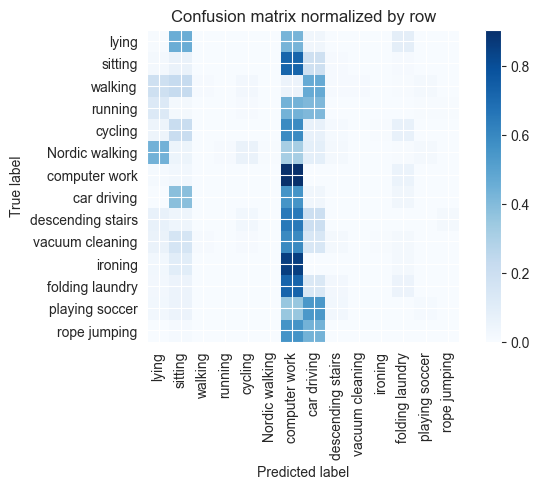

Training Epoch:   7%|▋         | 1/15 [00:26<06:05, 26.10s/it]

Overall accuracy: 0.148

                    precision     recall   f1-score rel. freq. abs. freq.|	 biggest thieves

    computer work       0.239      0.904      0.378      0.151        628|	 folding laundry: 0.056,	sitting: 0.027,	
          walking       0.556      0.010      0.020      0.118        491|	 car driving: 0.464,	sitting: 0.224,	lying: 0.187,	
          ironing       0.000      0.000      0.000      0.100        415|	 computer work: 0.853,	sitting: 0.099,	lying: 0.027,	
          sitting       0.041      0.060      0.049      0.092        384|	 computer work: 0.719,	car driving: 0.185,	
            lying       0.006      0.005      0.006      0.087        364|	 sitting: 0.453,	computer work: 0.426,	folding laundry: 0.085,	
  vacuum cleaning       0.000      0.000      0.000      0.082        342|	 computer work: 0.591,	sitting: 0.152,	car driving: 0.140,	
          cycling       0.000      0.000      0.000      0.081        335|	 computer work: 0.588,	sitting: 0.209,	fo


train: 100%|██████████| 261/261 [00:23<00:00, 10.89batch/s, loss=6.93, accuracy=0.266]


torch.Size([14, 400])



seen: 100%|██████████| 65/65 [00:01<00:00, 38.00batch/s, loss=2.02]


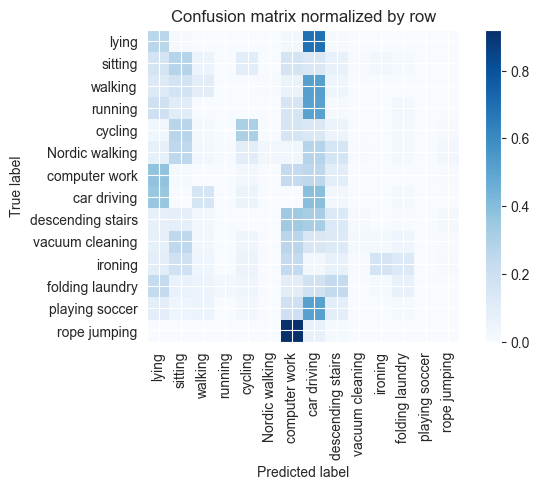

Training Epoch:  13%|█▎        | 2/15 [00:52<05:40, 26.22s/it]

Overall accuracy: 0.158

                    precision     recall   f1-score rel. freq. abs. freq.|	 biggest thieves

    computer work       0.205      0.231      0.217      0.151        628|	 lying: 0.373,	car driving: 0.255,	
          walking       0.319      0.093      0.145      0.118        492|	 car driving: 0.514,	sitting: 0.169,	lying: 0.116,	
          ironing       0.767      0.159      0.264      0.100        414|	 computer work: 0.234,	sitting: 0.186,	
          sitting       0.181      0.276      0.218      0.092        384|	 computer work: 0.161,	lying: 0.159,	
            lying       0.138      0.264      0.181      0.087        363|	 car driving: 0.691,	computer work: 0.022,	
  vacuum cleaning       0.438      0.020      0.039      0.082        343|	 computer work: 0.259,	sitting: 0.251,	car driving: 0.137,	
          cycling       0.433      0.307      0.360      0.081        335|	 sitting: 0.269,	computer work: 0.152,	
   Nordic walking       0.667      0.031      0


train: 100%|██████████| 261/261 [00:22<00:00, 11.36batch/s, loss=5.48, accuracy=0.0938]


torch.Size([14, 400])



seen: 100%|██████████| 65/65 [00:01<00:00, 33.43batch/s, loss=2.1] 


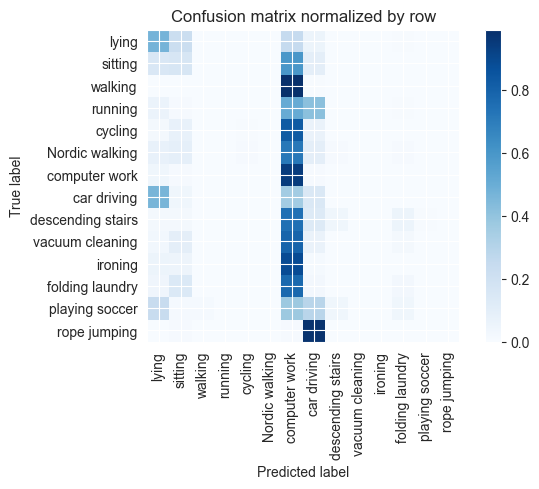

Training Epoch:  20%|██        | 3/15 [01:17<05:10, 25.85s/it]

Overall accuracy: 0.205

                    precision     recall   f1-score rel. freq. abs. freq.|	 biggest thieves

    computer work       0.196      0.944      0.324      0.150        626|	 lying: 0.038,	car driving: 0.008,	
          walking       0.000      0.000      0.000      0.118        492|	 computer work: 0.992,	car driving: 0.006,	rope jumping: 0.002,	
          ironing       0.500      0.002      0.005      0.100        414|	 computer work: 0.884,	lying: 0.051,	sitting: 0.048,	
          sitting       0.207      0.158      0.179      0.093        385|	 computer work: 0.595,	lying: 0.151,	
            lying       0.424      0.470      0.446      0.088        366|	 computer work: 0.246,	sitting: 0.224,	
  vacuum cleaning       0.000      0.000      0.000      0.083        345|	 computer work: 0.791,	sitting: 0.096,	car driving: 0.064,	
          cycling       0.333      0.006      0.012      0.081        337|	 computer work: 0.828,	sitting: 0.077,	car driving: 0.062,	
   N


train: 100%|██████████| 261/261 [00:24<00:00, 10.81batch/s, loss=3.8, accuracy=0.109]


torch.Size([14, 400])



seen: 100%|██████████| 65/65 [00:01<00:00, 35.54batch/s, loss=2.68]


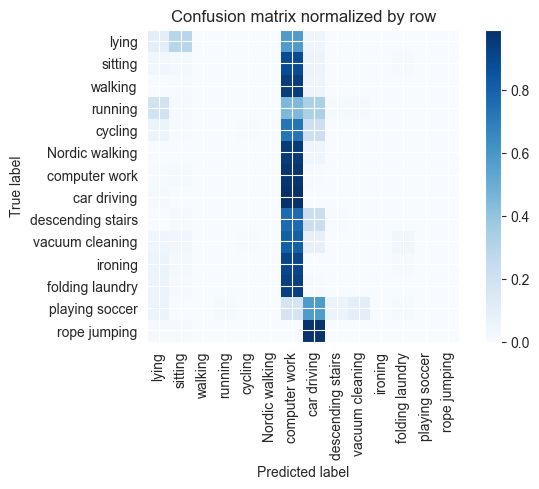

Training Epoch:  27%|██▋       | 4/15 [01:44<04:46, 26.09s/it]

Overall accuracy: 0.158

                    precision     recall   f1-score rel. freq. abs. freq.|	 biggest thieves

    computer work       0.181      0.975      0.305      0.151        628|	 sitting: 0.013,	car driving: 0.006,	
          walking       0.000      0.000      0.000      0.118        491|	 computer work: 0.943,	car driving: 0.049,	sitting: 0.006,	
          ironing       0.000      0.000      0.000      0.099        411|	 computer work: 0.910,	lying: 0.061,	sitting: 0.019,	
          sitting       0.040      0.016      0.022      0.093        385|	 computer work: 0.886,	car driving: 0.055,	lying: 0.034,	
            lying       0.217      0.099      0.136      0.087        363|	 computer work: 0.573,	sitting: 0.287,	
  vacuum cleaning       0.000      0.000      0.000      0.083        346|	 computer work: 0.806,	car driving: 0.078,	lying: 0.040,	
          cycling       0.500      0.006      0.012      0.081        335|	 computer work: 0.728,	car driving: 0.209,	lying:


train: 100%|██████████| 261/261 [00:23<00:00, 11.22batch/s, loss=5.65, accuracy=0.0469]


torch.Size([14, 400])



seen: 100%|██████████| 65/65 [00:01<00:00, 36.34batch/s, loss=2.16]


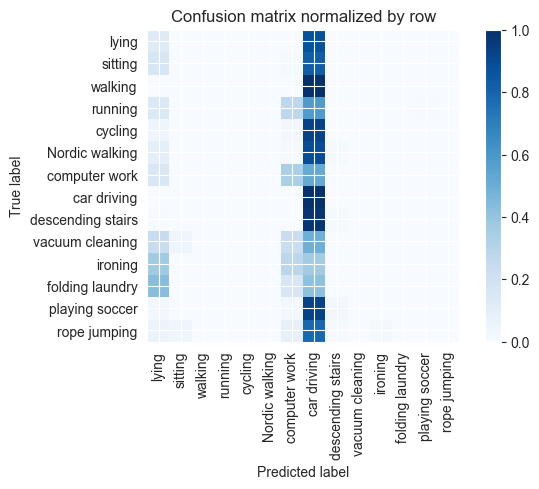

Training Epoch:  33%|███▎      | 5/15 [02:09<04:18, 25.88s/it]

Overall accuracy: 0.087

                    precision     recall   f1-score rel. freq. abs. freq.|	 biggest thieves

    computer work       0.403      0.334      0.366      0.150        625|	 car driving: 0.514,	lying: 0.152,	
          walking       0.000      0.000      0.000      0.118        492|	 car driving: 0.996,	rope jumping: 0.002,	lying: 0.002,	
          ironing       0.000      0.000      0.000      0.100        417|	 lying: 0.365,	car driving: 0.357,	computer work: 0.278,	
          sitting       0.000      0.000      0.000      0.093        385|	 car driving: 0.821,	lying: 0.164,	computer work: 0.013,	
            lying       0.074      0.124      0.093      0.087        364|	 car driving: 0.871,	computer work: 0.003,	
  vacuum cleaning       0.000      0.000      0.000      0.083        344|	 car driving: 0.494,	lying: 0.235,	computer work: 0.227,	
          cycling       0.000      0.000      0.000      0.080        334|	 car driving: 0.931,	lying: 0.042,	computer wo


train: 100%|██████████| 261/261 [00:23<00:00, 11.06batch/s, loss=0.715, accuracy=0.0938]


torch.Size([14, 400])



seen: 100%|██████████| 65/65 [00:01<00:00, 37.38batch/s, loss=1.57]


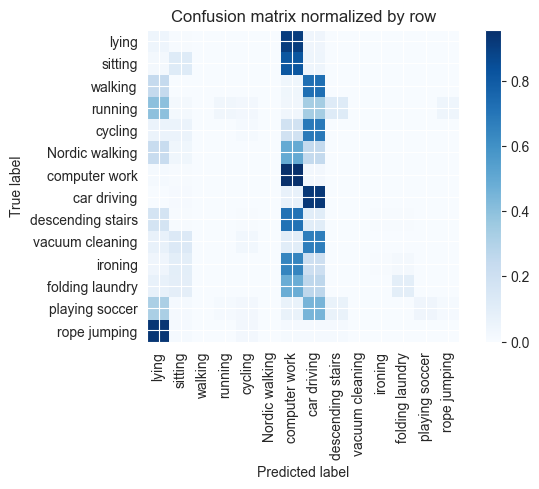

Training Epoch:  40%|████      | 6/15 [02:35<03:52, 25.85s/it]

Overall accuracy: 0.191

                    precision     recall   f1-score rel. freq. abs. freq.|	 biggest thieves

    computer work       0.294      0.955      0.449      0.151        628|	 car driving: 0.025,	lying: 0.013,	
          walking       0.000      0.000      0.000      0.118        490|	 car driving: 0.722,	lying: 0.241,	computer work: 0.035,	
          ironing       0.667      0.005      0.010      0.100        416|	 computer work: 0.639,	car driving: 0.202,	sitting: 0.094,	
          sitting       0.236      0.117      0.156      0.093        385|	 computer work: 0.810,	car driving: 0.044,	
            lying       0.031      0.044      0.036      0.088        366|	 computer work: 0.904,	car driving: 0.041,	
  vacuum cleaning       0.000      0.000      0.000      0.083        345|	 car driving: 0.667,	sitting: 0.128,	computer work: 0.101,	
          cycling       0.148      0.012      0.022      0.081        336|	 car driving: 0.685,	computer work: 0.185,	lying: 0.060


train: 100%|██████████| 261/261 [00:23<00:00, 10.92batch/s, loss=3.32, accuracy=0.0938]


torch.Size([14, 400])



seen: 100%|██████████| 65/65 [00:01<00:00, 39.63batch/s, loss=0.533]


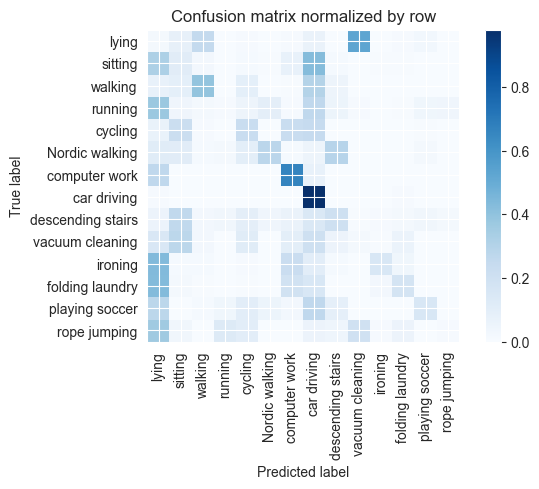

Training Epoch:  47%|████▋     | 7/15 [03:01<03:27, 25.90s/it]

Overall accuracy: 0.261

                    precision     recall   f1-score rel. freq. abs. freq.|	 biggest thieves

    computer work       0.581      0.662      0.619      0.150        624|	 lying: 0.261,	car driving: 0.072,	
          walking       0.595      0.394      0.474      0.118        492|	 car driving: 0.299,	sitting: 0.091,	
          ironing       0.829      0.151      0.256      0.100        416|	 lying: 0.435,	computer work: 0.226,	
          sitting       0.108      0.109      0.108      0.093        386|	 car driving: 0.427,	lying: 0.321,	
            lying       0.009      0.022      0.013      0.087        364|	 vacuum cleaning: 0.527,	walking: 0.250,	sitting: 0.080,	
  vacuum cleaning       0.032      0.020      0.025      0.083        344|	 sitting: 0.273,	car driving: 0.203,	lying: 0.148,	
          cycling       0.305      0.227      0.260      0.081        335|	 car driving: 0.245,	computer work: 0.227,	
   Nordic walking       0.732      0.279      0.404    


train: 100%|██████████| 261/261 [00:24<00:00, 10.78batch/s, loss=0.237, accuracy=0.344]


torch.Size([14, 400])



seen: 100%|██████████| 65/65 [00:01<00:00, 43.16batch/s, loss=0.591]


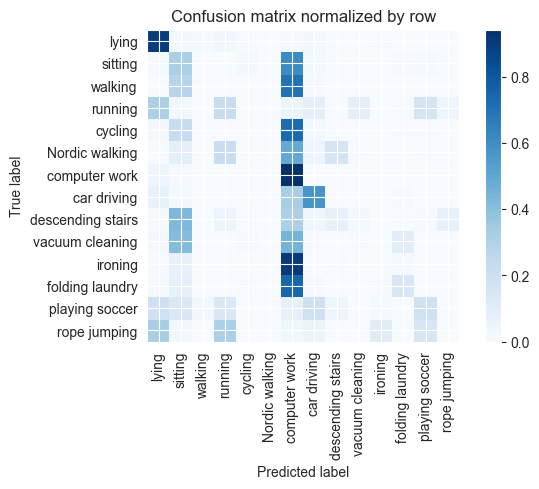

Training Epoch:  53%|█████▎    | 8/15 [03:27<03:02, 26.01s/it]

Overall accuracy: 0.289

                    precision     recall   f1-score rel. freq. abs. freq.|	 biggest thieves

    computer work       0.248      0.942      0.392      0.150        626|	 lying: 0.042,	sitting: 0.010,	
          walking       0.100      0.002      0.004      0.119        494|	 computer work: 0.702,	sitting: 0.279,	car driving: 0.010,	
          ironing       0.000      0.000      0.000      0.100        417|	 computer work: 0.904,	sitting: 0.067,	folding laundry: 0.012,	
          sitting       0.182      0.315      0.231      0.092        384|	 computer work: 0.609,	car driving: 0.021,	
            lying       0.664      0.896      0.763      0.087        364|	 running: 0.030,	sitting: 0.022,	
  vacuum cleaning       0.087      0.006      0.011      0.082        343|	 computer work: 0.446,	sitting: 0.411,	folding laundry: 0.099,	
          cycling       0.000      0.000      0.000      0.081        336|	 computer work: 0.726,	sitting: 0.223,	car driving: 0.021,	


train: 100%|██████████| 261/261 [00:24<00:00, 10.83batch/s, loss=1.31, accuracy=0.0312]


torch.Size([14, 400])



seen: 100%|██████████| 65/65 [00:01<00:00, 43.05batch/s, loss=0.312]


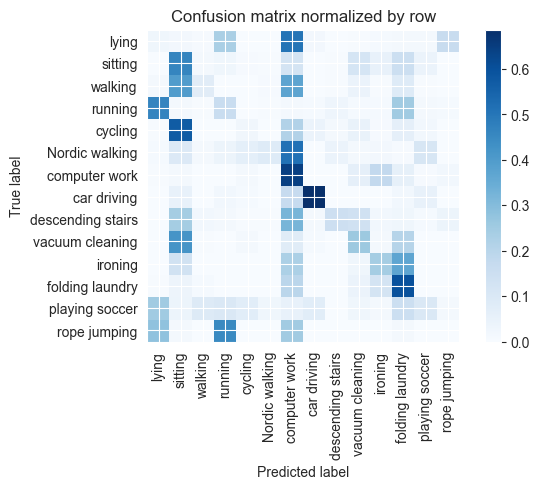

Training Epoch:  60%|██████    | 9/15 [03:53<02:36, 26.04s/it]

Overall accuracy: 0.269

                    precision     recall   f1-score rel. freq. abs. freq.|	 biggest thieves

    computer work       0.304      0.645      0.413      0.150        625|	 ironing: 0.178,	vacuum cleaning: 0.061,	
          walking       0.594      0.077      0.137      0.118        492|	 sitting: 0.394,	computer work: 0.372,	folding laundry: 0.083,	
          ironing       0.359      0.243      0.290      0.100        415|	 folding laundry: 0.369,	computer work: 0.227,	
          sitting       0.204      0.460      0.283      0.093        387|	 folding laundry: 0.150,	computer work: 0.121,	
            lying       0.057      0.025      0.034      0.088        365|	 computer work: 0.504,	running: 0.233,	rope jumping: 0.164,	
  vacuum cleaning       0.337      0.259      0.293      0.083        344|	 sitting: 0.419,	folding laundry: 0.206,	
          cycling       0.157      0.024      0.042      0.080        333|	 sitting: 0.571,	computer work: 0.213,	folding laund


train: 100%|██████████| 261/261 [00:24<00:00, 10.84batch/s, loss=0.176, accuracy=0.156]


torch.Size([14, 400])



seen: 100%|██████████| 65/65 [00:01<00:00, 41.92batch/s, loss=0.233]


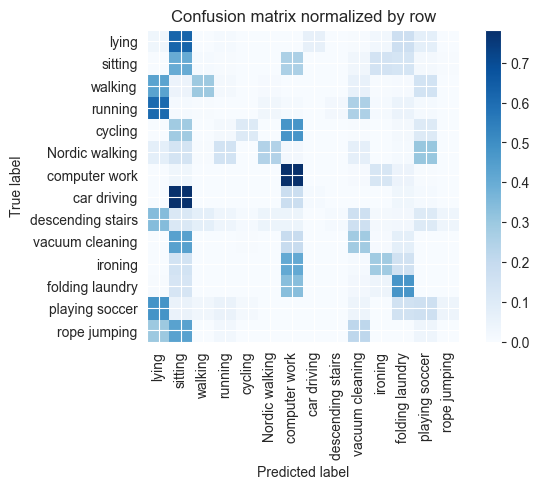

Training Epoch:  67%|██████▋   | 10/15 [04:19<02:10, 26.05s/it]

Overall accuracy: 0.300

                    precision     recall   f1-score rel. freq. abs. freq.|	 biggest thieves

    computer work       0.449      0.783      0.571      0.150        626|	 ironing: 0.128,	folding laundry: 0.045,	
          walking       0.862      0.294      0.438      0.118        490|	 lying: 0.429,	playing soccer: 0.145,	
          ironing       0.425      0.287      0.342      0.100        415|	 computer work: 0.410,	folding laundry: 0.147,	
          sitting       0.162      0.398      0.231      0.092        384|	 computer work: 0.258,	ironing: 0.143,	
            lying       0.022      0.030      0.026      0.087        361|	 sitting: 0.623,	folding laundry: 0.166,	playing soccer: 0.072,	
  vacuum cleaning       0.354      0.284      0.315      0.083        345|	 sitting: 0.435,	computer work: 0.186,	
          cycling       0.846      0.098      0.176      0.081        337|	 computer work: 0.475,	sitting: 0.285,	playing soccer: 0.104,	
   Nordic walking   


train: 100%|██████████| 261/261 [00:26<00:00,  9.91batch/s, loss=0.178, accuracy=0.0625]


torch.Size([14, 400])



seen: 100%|██████████| 65/65 [00:01<00:00, 41.71batch/s, loss=0.191]


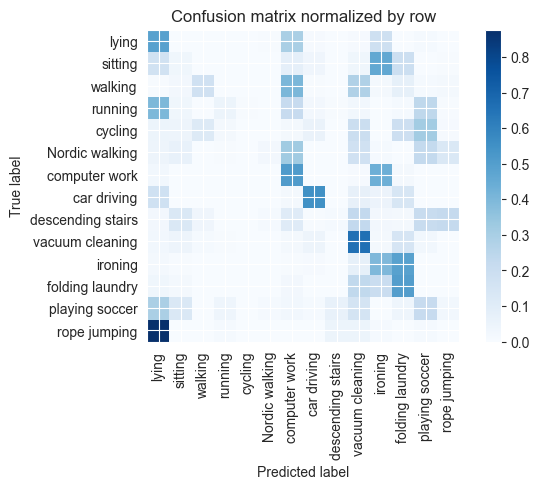

Training Epoch:  73%|███████▎  | 11/15 [04:48<01:47, 26.76s/it]

Overall accuracy: 0.284

                    precision     recall   f1-score rel. freq. abs. freq.|	 biggest thieves

    computer work       0.377      0.507      0.432      0.150        625|	 ironing: 0.434,	lying: 0.026,	
          walking       0.620      0.172      0.269      0.119        494|	 computer work: 0.403,	vacuum cleaning: 0.277,	
          ironing       0.219      0.394      0.282      0.100        416|	 folding laundry: 0.488,	vacuum cleaning: 0.075,	
          sitting       0.107      0.034      0.051      0.093        385|	 ironing: 0.460,	folding laundry: 0.190,	lying: 0.166,	
            lying       0.345      0.486      0.404      0.087        364|	 computer work: 0.297,	ironing: 0.179,	
  vacuum cleaning       0.344      0.660      0.453      0.083        344|	 folding laundry: 0.145,	car driving: 0.044,	
          cycling       0.500      0.003      0.006      0.081        335|	 playing soccer: 0.313,	vacuum cleaning: 0.194,	folding laundry: 0.185,	
   Nordic wa


train: 100%|██████████| 261/261 [00:24<00:00, 10.72batch/s, loss=0.177, accuracy=0.0938]


torch.Size([14, 400])



seen: 100%|██████████| 65/65 [00:01<00:00, 41.13batch/s, loss=0.175]


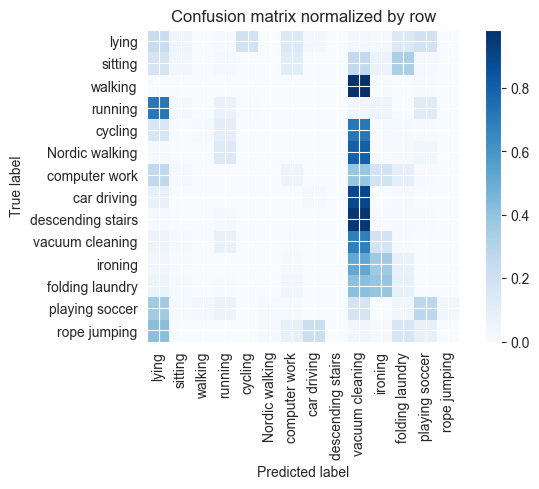

Training Epoch:  80%|████████  | 12/15 [05:14<01:19, 26.64s/it]

Overall accuracy: 0.138

                    precision     recall   f1-score rel. freq. abs. freq.|	 biggest thieves

    computer work       0.237      0.057      0.092      0.151        628|	 vacuum cleaning: 0.387,	lying: 0.260,	ironing: 0.182,	
          walking       0.125      0.002      0.004      0.118        490|	 vacuum cleaning: 0.984,	playing soccer: 0.006,	ironing: 0.006,	
          ironing       0.328      0.361      0.344      0.100        415|	 vacuum cleaning: 0.516,	folding laundry: 0.072,	
          sitting       0.235      0.031      0.055      0.093        386|	 folding laundry: 0.329,	vacuum cleaning: 0.256,	lying: 0.176,	
            lying       0.137      0.238      0.174      0.087        362|	 playing soccer: 0.191,	cycling: 0.188,	
  vacuum cleaning       0.108      0.682      0.186      0.082        343|	 ironing: 0.178,	running: 0.070,	
          cycling       0.000      0.000      0.000      0.081        336|	 vacuum cleaning: 0.711,	lying: 0.152,	running:


train: 100%|██████████| 261/261 [00:24<00:00, 10.73batch/s, loss=0.176, accuracy=0.0625]


torch.Size([14, 400])



seen: 100%|██████████| 65/65 [00:01<00:00, 40.62batch/s, loss=0.177]


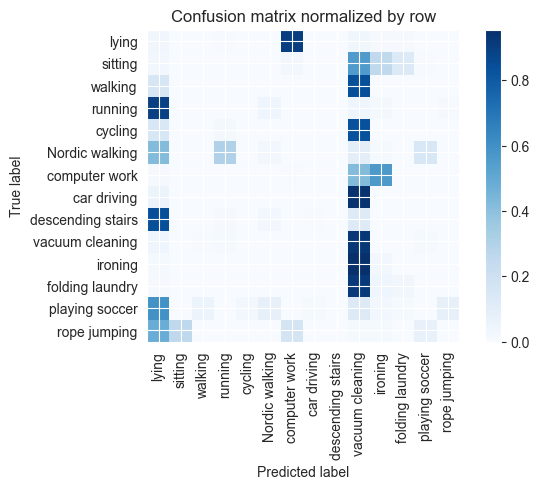

Training Epoch:  87%|████████▋ | 13/15 [05:41<00:53, 26.57s/it]

Overall accuracy: 0.087

                    precision     recall   f1-score rel. freq. abs. freq.|	 biggest thieves

    computer work       0.008      0.005      0.006      0.151        628|	 ironing: 0.564,	vacuum cleaning: 0.420,	lying: 0.010,	
          walking       0.000      0.000      0.000      0.119        494|	 vacuum cleaning: 0.840,	lying: 0.154,	playing soccer: 0.002,	
          ironing       0.025      0.029      0.027      0.099        413|	 vacuum cleaning: 0.954,	lying: 0.015,	
          sitting       0.040      0.003      0.005      0.092        384|	 vacuum cleaning: 0.555,	ironing: 0.250,	folding laundry: 0.128,	
            lying       0.016      0.033      0.022      0.088        366|	 computer work: 0.902,	vacuum cleaning: 0.036,	
  vacuum cleaning       0.141      0.925      0.245      0.083        345|	 lying: 0.041,	playing soccer: 0.012,	
          cycling       0.000      0.000      0.000      0.081        335|	 vacuum cleaning: 0.833,	lying: 0.146,	runnin


train: 100%|██████████| 261/261 [00:25<00:00, 10.26batch/s, loss=0.174, accuracy=0.219]


torch.Size([14, 400])



seen: 100%|██████████| 65/65 [00:01<00:00, 40.88batch/s, loss=0.176]


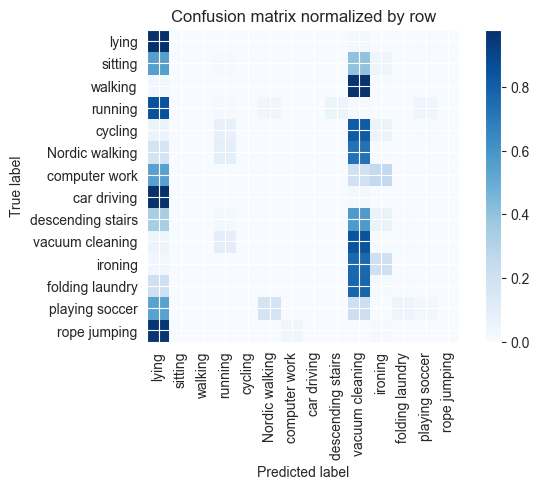

Training Epoch:  93%|█████████▎| 14/15 [06:08<00:26, 26.84s/it]

Overall accuracy: 0.176

                    precision     recall   f1-score rel. freq. abs. freq.|	 biggest thieves

    computer work       0.000      0.000      0.000      0.151        630|	 lying: 0.544,	ironing: 0.254,	vacuum cleaning: 0.198,	
          walking       0.000      0.000      0.000      0.119        493|	 vacuum cleaning: 0.966,	lying: 0.026,	ironing: 0.006,	
          ironing       0.281      0.205      0.237      0.100        414|	 vacuum cleaning: 0.763,	lying: 0.029,	
          sitting       0.000      0.000      0.000      0.093        386|	 lying: 0.552,	vacuum cleaning: 0.396,	ironing: 0.041,	
            lying       0.232      0.975      0.375      0.087        364|	 vacuum cleaning: 0.019,	playing soccer: 0.005,	
  vacuum cleaning       0.133      0.845      0.229      0.082        341|	 running: 0.094,	lying: 0.047,	
          cycling       0.000      0.000      0.000      0.081        336|	 vacuum cleaning: 0.812,	running: 0.071,	ironing: 0.057,	
   Nordic 


train: 100%|██████████| 261/261 [00:26<00:00,  9.79batch/s, loss=0.173, accuracy=0.172]


torch.Size([14, 400])



seen: 100%|██████████| 65/65 [00:02<00:00, 32.11batch/s, loss=0.176]


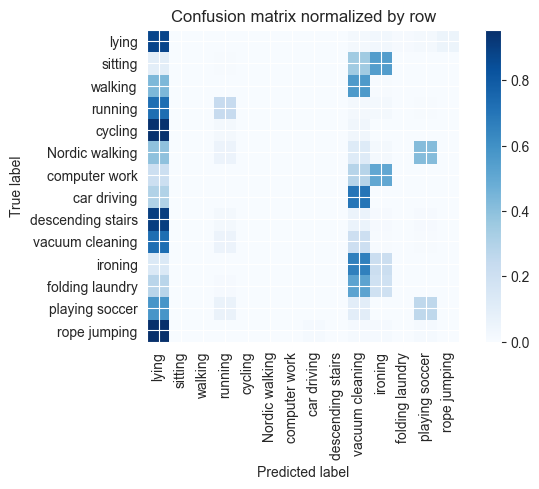

Overall accuracy: 0.130

                    precision     recall   f1-score rel. freq. abs. freq.|	 biggest thieves

    computer work       0.000      0.000      0.000      0.151        628|	 ironing: 0.506,	vacuum cleaning: 0.287,	lying: 0.207,	
          walking       0.000      0.000      0.000      0.117        488|	 vacuum cleaning: 0.559,	lying: 0.434,	ironing: 0.006,	
          ironing       0.127      0.209      0.158      0.100        416|	 vacuum cleaning: 0.659,	lying: 0.132,	
          sitting       0.500      0.003      0.005      0.093        388|	 ironing: 0.546,	vacuum cleaning: 0.348,	lying: 0.095,	
            lying       0.161      0.874      0.271      0.087        364|	 rope jumping: 0.049,	ironing: 0.027,	
  vacuum cleaning       0.059      0.203      0.091      0.083        344|	 lying: 0.724,	running: 0.052,	
          cycling       0.000      0.000      0.000      0.081        335|	 lying: 0.946,	vacuum cleaning: 0.033,	running: 0.015,	
   Nordic walking     

unseen: 100%|██████████| 87/87 [00:01<00:00, 54.77batch/s, loss=0.171]


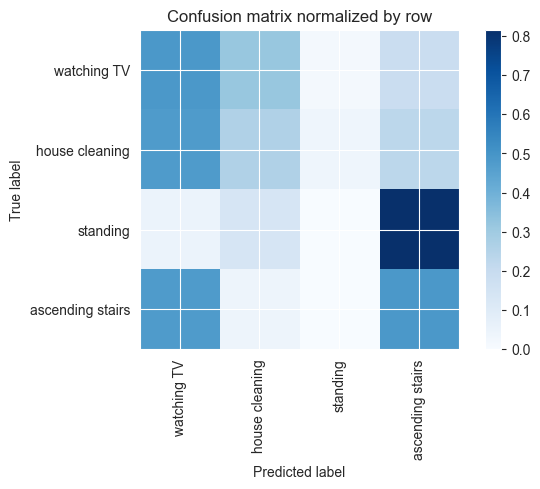

Overall accuracy: 0.251

                   precision     recall   f1-score rel. freq. abs. freq.|	 biggest thieves

        standing       0.000      0.000      0.000      0.330       1837|	 ascending stairs: 0.815,	house cleaning: 0.136,	watching TV: 0.049,	
  house cleaning       0.463      0.260      0.333      0.329       1832|	 watching TV: 0.475,	ascending stairs: 0.228,	
ascending stairs       0.201      0.485      0.284      0.193       1073|	 watching TV: 0.475,	house cleaning: 0.040,	
     watching TV       0.214      0.485      0.297      0.148        826|	 house cleaning: 0.316,	ascending stairs: 0.185,	

----------------------------------------------------------------------------------------------------
     avg / total       0.223      0.251      0.209        1.0       5568|	      

{'accuracy': 0.2510775862068966, 'precision': 0.2195414866909301, 'recall': 0.30761647189776314, 'f1': 0.22864709407768388}
================ Fold-1 ================
Unseen Classes : ['walking

Training Epoch:   0%|          | 0/15 [00:00<?, ?it/s]

torch.Size([14, 400])



train: 100%|██████████| 262/262 [00:24<00:00, 10.87batch/s, loss=13, accuracy=0.0938] 


torch.Size([14, 400])



seen: 100%|██████████| 65/65 [00:01<00:00, 41.52batch/s, loss=4.89]


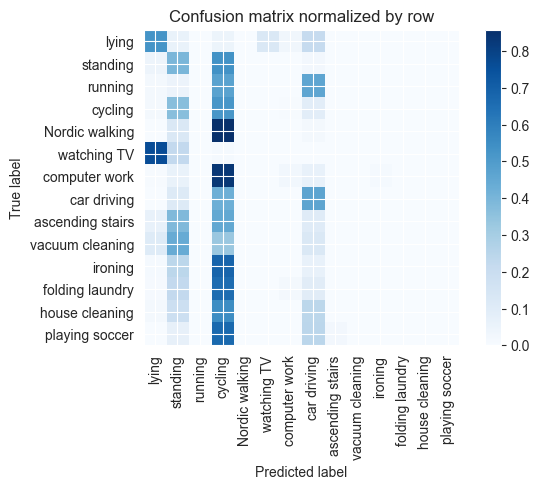

Training Epoch:   7%|▋         | 1/15 [00:26<06:06, 26.19s/it]

Overall accuracy: 0.139

                   precision     recall   f1-score rel. freq. abs. freq.|	 biggest thieves

   computer work       0.457      0.026      0.048      0.151        627|	 cycling: 0.833,	car driving: 0.064,	standing: 0.057,	
         ironing       0.000      0.000      0.000      0.113        469|	 cycling: 0.684,	standing: 0.239,	car driving: 0.064,	
        standing       0.175      0.398      0.243      0.093        387|	 cycling: 0.535,	lying: 0.041,	
  Nordic walking       0.000      0.000      0.000      0.093        386|	 cycling: 0.858,	standing: 0.127,	car driving: 0.016,	
           lying       0.476      0.526      0.500      0.088        365|	 car driving: 0.214,	watching TV: 0.123,	
  house cleaning       0.000      0.000      0.000      0.087        364|	 cycling: 0.552,	car driving: 0.239,	standing: 0.187,	
         cycling       0.074      0.519      0.129      0.078        324|	 standing: 0.367,	car driving: 0.090,	
 vacuum cleaning       0.500    


train: 100%|██████████| 262/262 [00:24<00:00, 10.53batch/s, loss=7.76, accuracy=0.188] 


torch.Size([14, 400])



seen: 100%|██████████| 65/65 [00:01<00:00, 42.01batch/s, loss=6.15]


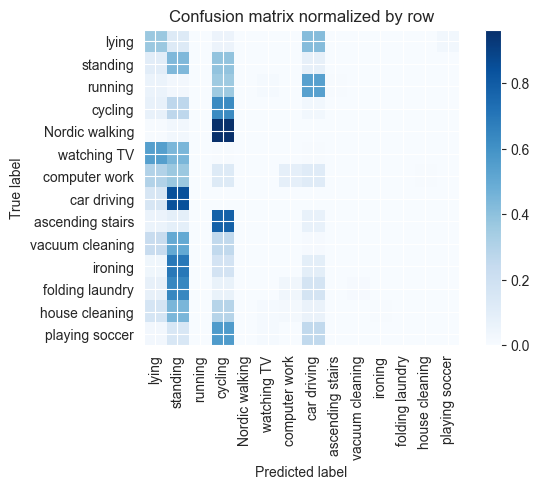

Training Epoch:  13%|█▎        | 2/15 [00:53<05:46, 26.63s/it]

Overall accuracy: 0.134

                   precision     recall   f1-score rel. freq. abs. freq.|	 biggest thieves

   computer work       0.757      0.085      0.152      0.151        627|	 standing: 0.367,	lying: 0.298,	cycling: 0.126,	
         ironing       0.000      0.000      0.000      0.114        473|	 standing: 0.696,	cycling: 0.173,	car driving: 0.095,	
        standing       0.111      0.433      0.177      0.093        388|	 cycling: 0.389,	lying: 0.098,	
  Nordic walking       1.000      0.003      0.005      0.093        385|	 cycling: 0.964,	standing: 0.029,	lying: 0.005,	
           lying       0.199      0.366      0.257      0.088        366|	 car driving: 0.421,	standing: 0.126,	
  house cleaning       0.000      0.000      0.000      0.087        361|	 standing: 0.446,	cycling: 0.288,	lying: 0.163,	
         cycling       0.147      0.627      0.238      0.077        322|	 standing: 0.267,	lying: 0.075,	
 vacuum cleaning       0.000      0.000      0.000      0.0


train: 100%|██████████| 262/262 [00:24<00:00, 10.83batch/s, loss=4.3, accuracy=0.188]


torch.Size([14, 400])



seen: 100%|██████████| 65/65 [00:01<00:00, 41.67batch/s, loss=3.86]


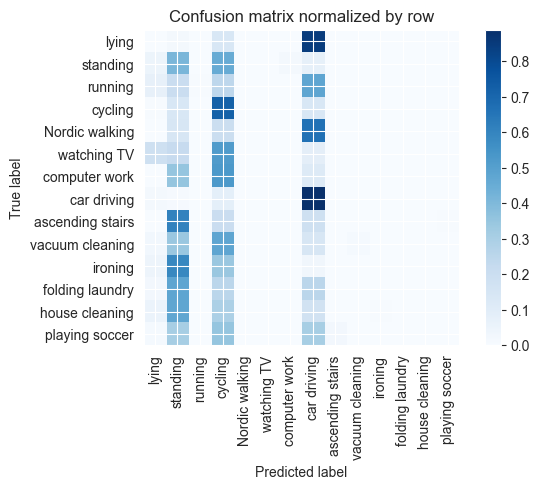

Training Epoch:  20%|██        | 3/15 [01:19<05:17, 26.45s/it]

Overall accuracy: 0.117

                   precision     recall   f1-score rel. freq. abs. freq.|	 biggest thieves

   computer work       0.250      0.003      0.006      0.151        629|	 cycling: 0.526,	standing: 0.353,	car driving: 0.111,	
         ironing       0.000      0.000      0.000      0.113        470|	 standing: 0.587,	cycling: 0.340,	lying: 0.043,	
  Nordic walking       0.000      0.000      0.000      0.093        386|	 car driving: 0.663,	cycling: 0.197,	standing: 0.140,	
        standing       0.116      0.411      0.182      0.092        384|	 cycling: 0.453,	car driving: 0.073,	
           lying       0.000      0.000      0.000      0.088        368|	 car driving: 0.845,	cycling: 0.139,	standing: 0.016,	
  house cleaning       0.000      0.000      0.000      0.087        364|	 standing: 0.475,	cycling: 0.294,	car driving: 0.170,	
         cycling       0.152      0.721      0.251      0.078        323|	 car driving: 0.136,	standing: 0.136,	
 vacuum cleaning   


train: 100%|██████████| 262/262 [00:25<00:00, 10.14batch/s, loss=6.37, accuracy=0.0469]


torch.Size([14, 400])



seen: 100%|██████████| 65/65 [00:01<00:00, 42.50batch/s, loss=5.07]


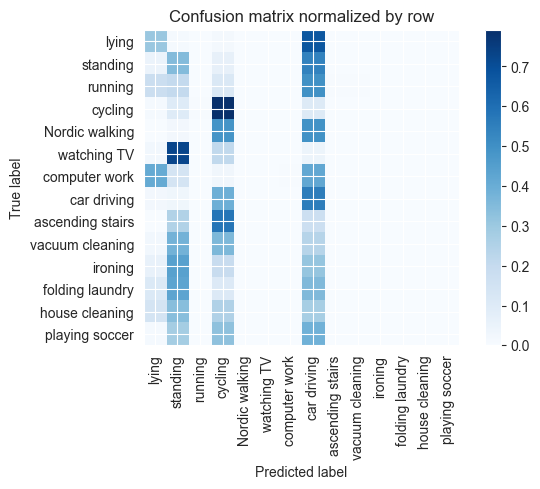

Training Epoch:  27%|██▋       | 4/15 [01:47<04:56, 27.00s/it]

Overall accuracy: 0.134

                   precision     recall   f1-score rel. freq. abs. freq.|	 biggest thieves

   computer work       1.000      0.003      0.006      0.150        626|	 car driving: 0.420,	lying: 0.411,	standing: 0.139,	
         ironing       0.000      0.000      0.000      0.114        474|	 standing: 0.441,	car driving: 0.314,	cycling: 0.186,	
  Nordic walking       0.000      0.000      0.000      0.093        386|	 car driving: 0.492,	cycling: 0.487,	standing: 0.021,	
        standing       0.130      0.348      0.189      0.093        385|	 car driving: 0.540,	cycling: 0.065,	
  house cleaning       0.000      0.000      0.000      0.088        367|	 standing: 0.338,	car driving: 0.272,	cycling: 0.251,	
           lying       0.208      0.303      0.247      0.088        366|	 car driving: 0.672,	cycling: 0.014,	
         cycling       0.245      0.792      0.374      0.077        322|	 car driving: 0.099,	standing: 0.096,	
 vacuum cleaning       0.000    


train: 100%|██████████| 262/262 [00:25<00:00, 10.44batch/s, loss=1.28, accuracy=0.172]


torch.Size([14, 400])



seen: 100%|██████████| 65/65 [00:01<00:00, 41.24batch/s, loss=1.37]


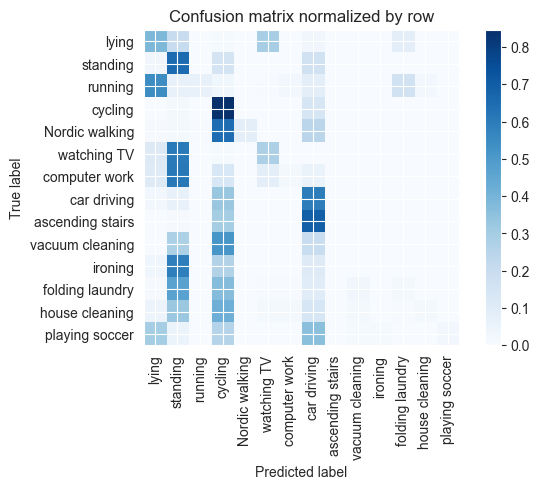

Training Epoch:  33%|███▎      | 5/15 [02:14<04:30, 27.06s/it]

Overall accuracy: 0.201

                   precision     recall   f1-score rel. freq. abs. freq.|	 biggest thieves

   computer work       0.455      0.016      0.031      0.150        625|	 standing: 0.611,	cycling: 0.130,	lying: 0.106,	
         ironing       0.333      0.002      0.004      0.113        471|	 standing: 0.588,	cycling: 0.263,	car driving: 0.104,	
        standing       0.178      0.654      0.280      0.093        387|	 car driving: 0.165,	cycling: 0.150,	
  Nordic walking       1.000      0.083      0.153      0.093        386|	 cycling: 0.648,	car driving: 0.238,	
  house cleaning       0.500      0.016      0.032      0.088        366|	 cycling: 0.418,	standing: 0.322,	car driving: 0.134,	
           lying       0.354      0.386      0.369      0.087        363|	 watching TV: 0.292,	standing: 0.201,	
         cycling       0.211      0.846      0.338      0.078        325|	 car driving: 0.135,	standing: 0.018,	
 vacuum cleaning       0.067      0.003      0.006  


train: 100%|██████████| 262/262 [00:24<00:00, 10.67batch/s, loss=0.185, accuracy=0.141]


torch.Size([14, 400])



seen: 100%|██████████| 65/65 [00:01<00:00, 37.57batch/s, loss=0.485]


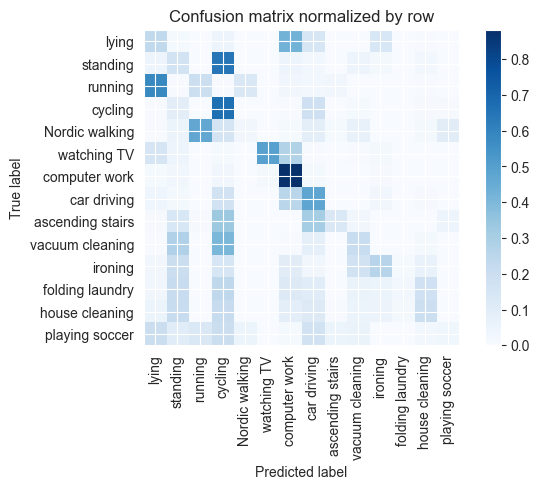

Training Epoch:  40%|████      | 6/15 [02:41<04:02, 26.97s/it]

Overall accuracy: 0.331

                   precision     recall   f1-score rel. freq. abs. freq.|	 biggest thieves

   computer work       0.607      0.882      0.719      0.150        626|	 standing: 0.030,	cycling: 0.029,	
         ironing       0.552      0.261      0.354      0.113        471|	 standing: 0.197,	vacuum cleaning: 0.172,	
        standing       0.131      0.163      0.145      0.093        387|	 cycling: 0.643,	computer work: 0.044,	
  Nordic walking       0.297      0.029      0.052      0.092        383|	 running: 0.467,	cycling: 0.154,	playing soccer: 0.099,	
           lying       0.284      0.231      0.255      0.088        368|	 computer work: 0.421,	car driving: 0.144,	
  house cleaning       0.424      0.192      0.265      0.087        364|	 cycling: 0.212,	standing: 0.212,	
         cycling       0.221      0.668      0.332      0.078        325|	 car driving: 0.185,	standing: 0.092,	
 vacuum cleaning       0.268      0.204      0.232      0.073        304


train: 100%|██████████| 262/262 [00:25<00:00, 10.41batch/s, loss=1.3, accuracy=0.156]  


torch.Size([14, 400])



seen: 100%|██████████| 65/65 [00:01<00:00, 41.67batch/s, loss=0.236]


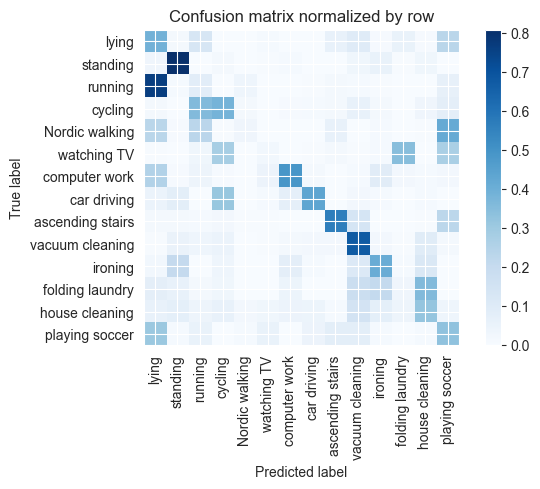

Training Epoch:  47%|████▋     | 7/15 [03:08<03:36, 27.05s/it]

Overall accuracy: 0.391

                   precision     recall   f1-score rel. freq. abs. freq.|	 biggest thieves

   computer work       0.790      0.488      0.603      0.150        625|	 lying: 0.251,	ironing: 0.090,	
         ironing       0.532      0.408      0.462      0.114        473|	 standing: 0.205,	house cleaning: 0.118,	
        standing       0.633      0.808      0.710      0.093        386|	 ironing: 0.054,	lying: 0.034,	
  Nordic walking       0.382      0.034      0.062      0.092        382|	 playing soccer: 0.416,	lying: 0.233,	running: 0.228,	
           lying       0.231      0.389      0.289      0.088        368|	 playing soccer: 0.231,	running: 0.128,	
  house cleaning       0.374      0.321      0.346      0.087        364|	 vacuum cleaning: 0.146,	ironing: 0.074,	
         cycling       0.443      0.383      0.411      0.078        324|	 running: 0.358,	playing soccer: 0.077,	
 vacuum cleaning       0.447      0.675      0.538      0.073        305|	 house


train: 100%|██████████| 262/262 [00:24<00:00, 10.57batch/s, loss=3.53, accuracy=0.0469]


torch.Size([14, 400])



seen: 100%|██████████| 65/65 [00:01<00:00, 41.30batch/s, loss=0.488]


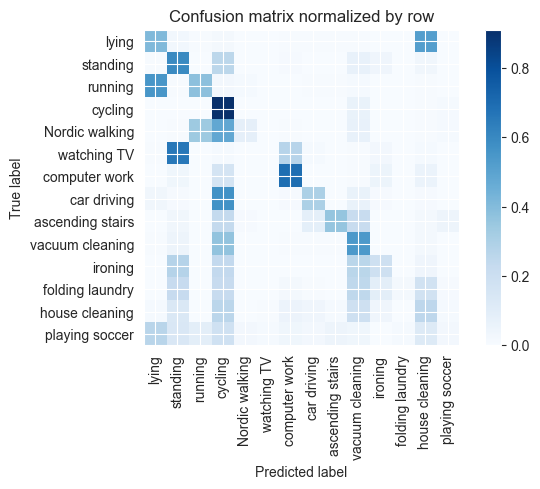

Training Epoch:  53%|█████▎    | 8/15 [03:35<03:08, 26.98s/it]

Overall accuracy: 0.397

                   precision     recall   f1-score rel. freq. abs. freq.|	 biggest thieves

   computer work       0.844      0.692      0.761      0.151        627|	 cycling: 0.159,	house cleaning: 0.054,	
         ironing       0.518      0.186      0.274      0.113        472|	 standing: 0.275,	vacuum cleaning: 0.261,	cycling: 0.237,	
        standing       0.362      0.594      0.450      0.092        384|	 cycling: 0.255,	vacuum cleaning: 0.065,	
  Nordic walking       0.811      0.078      0.143      0.092        383|	 cycling: 0.483,	running: 0.339,	
           lying       0.534      0.409      0.463      0.088        367|	 house cleaning: 0.518,	standing: 0.027,	
  house cleaning       0.224      0.252      0.237      0.088        365|	 cycling: 0.258,	vacuum cleaning: 0.186,	
         cycling       0.250      0.910      0.392      0.077        322|	 vacuum cleaning: 0.062,	playing soccer: 0.012,	
 vacuum cleaning       0.305      0.539      0.390      


train: 100%|██████████| 262/262 [00:25<00:00, 10.16batch/s, loss=0.266, accuracy=0.156]


torch.Size([14, 400])



seen: 100%|██████████| 65/65 [00:01<00:00, 37.57batch/s, loss=0.177]


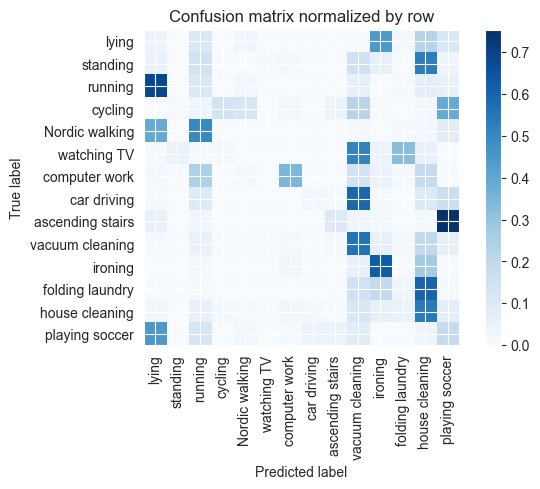

Training Epoch:  60%|██████    | 9/15 [04:03<02:43, 27.30s/it]

Overall accuracy: 0.239

                   precision     recall   f1-score rel. freq. abs. freq.|	 biggest thieves

   computer work       0.840      0.345      0.489      0.150        623|	 running: 0.242,	house cleaning: 0.188,	
         ironing       0.482      0.622      0.543      0.112        466|	 house cleaning: 0.268,	vacuum cleaning: 0.058,	
        standing       0.000      0.000      0.000      0.094        389|	 house cleaning: 0.527,	vacuum cleaning: 0.152,	running: 0.147,	
  Nordic walking       0.000      0.000      0.000      0.093        386|	 running: 0.495,	lying: 0.386,	playing soccer: 0.078,	
  house cleaning       0.203      0.536      0.295      0.088        366|	 vacuum cleaning: 0.117,	playing soccer: 0.074,	
           lying       0.043      0.044      0.043      0.088        365|	 ironing: 0.444,	house cleaning: 0.227,	playing soccer: 0.115,	
         cycling       0.815      0.135      0.232      0.078        325|	 playing soccer: 0.391,	vacuum cleaning: 0


train: 100%|██████████| 262/262 [00:25<00:00, 10.36batch/s, loss=0.201, accuracy=0.266]


torch.Size([14, 400])



seen: 100%|██████████| 65/65 [00:01<00:00, 41.14batch/s, loss=0.174]


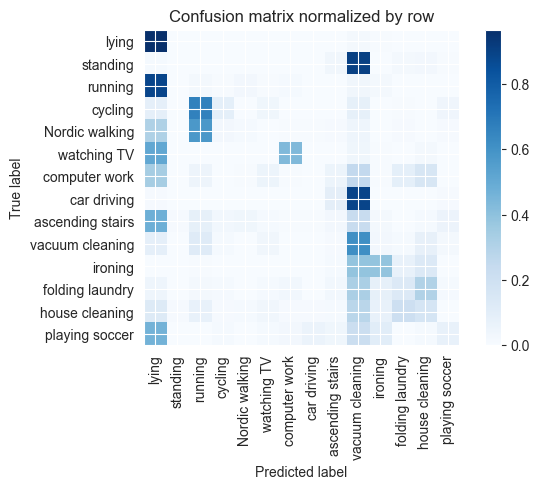

Training Epoch:  67%|██████▋   | 10/15 [04:30<02:16, 27.33s/it]

Overall accuracy: 0.206

                   precision     recall   f1-score rel. freq. abs. freq.|	 biggest thieves

   computer work       0.033      0.005      0.008      0.150        626|	 lying: 0.337,	vacuum cleaning: 0.252,	house cleaning: 0.158,	
         ironing       0.711      0.385      0.499      0.114        473|	 vacuum cleaning: 0.387,	house cleaning: 0.129,	
        standing       0.000      0.000      0.000      0.093        388|	 vacuum cleaning: 0.902,	ascending stairs: 0.031,	house cleaning: 0.026,	
  Nordic walking       0.192      0.013      0.024      0.092        384|	 running: 0.573,	lying: 0.310,	vacuum cleaning: 0.044,	
           lying       0.303      0.964      0.461      0.088        366|	 vacuum cleaning: 0.016,	ironing: 0.005,	
  house cleaning       0.182      0.163      0.172      0.087        363|	 vacuum cleaning: 0.275,	folding laundry: 0.204,	
         cycling       0.491      0.087      0.147      0.078        323|	 running: 0.659,	lying: 0.084,	


train: 100%|██████████| 262/262 [00:26<00:00,  9.93batch/s, loss=0.211, accuracy=0.203]


torch.Size([14, 400])



seen: 100%|██████████| 65/65 [00:01<00:00, 41.67batch/s, loss=0.174]


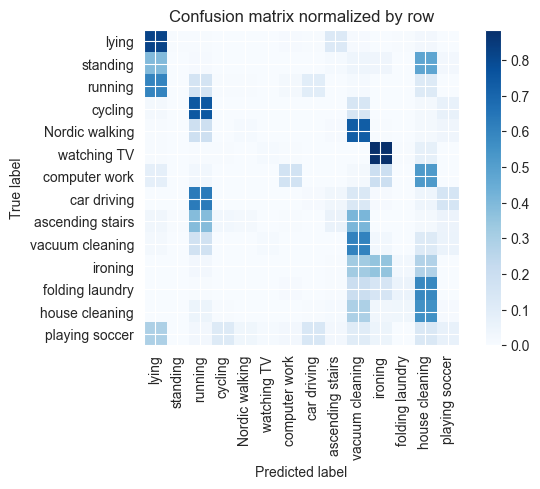

Training Epoch:  73%|███████▎  | 11/15 [04:59<01:50, 27.73s/it]

Overall accuracy: 0.244

                   precision     recall   f1-score rel. freq. abs. freq.|	 biggest thieves

   computer work       0.866      0.164      0.276      0.151        627|	 house cleaning: 0.522,	ironing: 0.193,	
         ironing       0.331      0.354      0.343      0.114        474|	 vacuum cleaning: 0.319,	house cleaning: 0.274,	
        standing       0.000      0.000      0.000      0.093        387|	 house cleaning: 0.475,	lying: 0.393,	vacuum cleaning: 0.041,	
  Nordic walking       0.333      0.013      0.025      0.092        382|	 vacuum cleaning: 0.730,	running: 0.183,	playing soccer: 0.037,	
  house cleaning       0.189      0.555      0.282      0.087        364|	 vacuum cleaning: 0.288,	running: 0.047,	
           lying       0.460      0.818      0.588      0.087        362|	 ascending stairs: 0.119,	house cleaning: 0.022,	
         cycling       0.048      0.003      0.006      0.078        324|	 running: 0.747,	vacuum cleaning: 0.142,	playing soccer


train: 100%|██████████| 262/262 [00:27<00:00,  9.62batch/s, loss=0.2, accuracy=0.0312] 


torch.Size([14, 400])



seen: 100%|██████████| 65/65 [00:01<00:00, 36.75batch/s, loss=0.186]


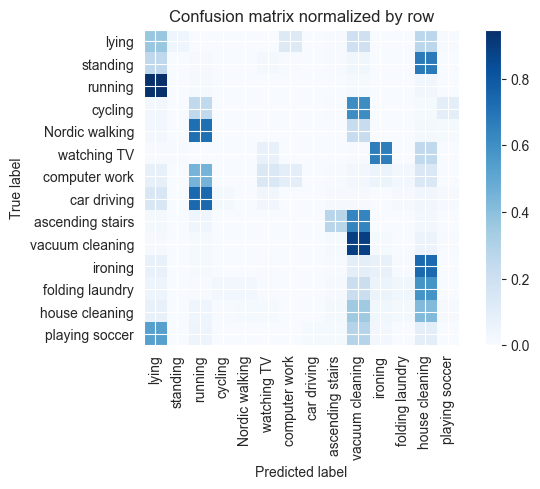

Training Epoch:  80%|████████  | 12/15 [05:28<01:24, 28.32s/it]

Overall accuracy: 0.174

                   precision     recall   f1-score rel. freq. abs. freq.|	 biggest thieves

   computer work       0.544      0.089      0.153      0.151        627|	 running: 0.450,	watching TV: 0.137,	house cleaning: 0.134,	
         ironing       0.166      0.072      0.100      0.113        472|	 house cleaning: 0.735,	vacuum cleaning: 0.091,	
        standing       0.000      0.000      0.000      0.093        388|	 house cleaning: 0.675,	lying: 0.255,	vacuum cleaning: 0.034,	
  Nordic walking       0.000      0.000      0.000      0.092        384|	 running: 0.716,	vacuum cleaning: 0.227,	lying: 0.026,	
           lying       0.224      0.365      0.278      0.087        364|	 house cleaning: 0.264,	vacuum cleaning: 0.198,	
  house cleaning       0.132      0.419      0.201      0.087        363|	 vacuum cleaning: 0.350,	lying: 0.069,	
         cycling       0.077      0.003      0.006      0.078        323|	 vacuum cleaning: 0.607,	running: 0.251,	playin


train: 100%|██████████| 262/262 [00:27<00:00,  9.67batch/s, loss=0.176, accuracy=0.141]


torch.Size([14, 400])



seen: 100%|██████████| 65/65 [00:02<00:00, 29.46batch/s, loss=0.176]


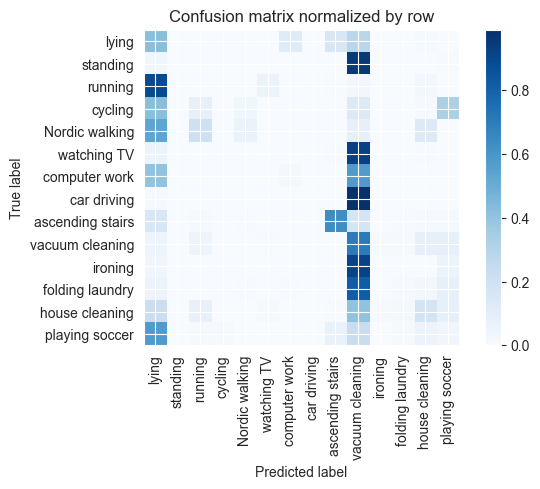

Training Epoch:  87%|████████▋ | 13/15 [05:58<00:57, 28.77s/it]

Overall accuracy: 0.144

                   precision     recall   f1-score rel. freq. abs. freq.|	 biggest thieves

   computer work       0.203      0.019      0.035      0.151        630|	 vacuum cleaning: 0.573,	lying: 0.400,	
         ironing       0.000      0.000      0.000      0.113        471|	 vacuum cleaning: 0.915,	playing soccer: 0.051,	lying: 0.032,	
  Nordic walking       0.615      0.062      0.113      0.093        386|	 lying: 0.531,	running: 0.205,	house cleaning: 0.124,	
        standing       0.000      0.000      0.000      0.093        385|	 vacuum cleaning: 0.958,	lying: 0.036,	playing soccer: 0.005,	
           lying       0.138      0.421      0.208      0.088        368|	 vacuum cleaning: 0.285,	ascending stairs: 0.152,	
  house cleaning       0.377      0.170      0.235      0.086        358|	 vacuum cleaning: 0.399,	lying: 0.221,	
         cycling       0.000      0.000      0.000      0.078        323|	 lying: 0.418,	playing soccer: 0.325,	vacuum cleaning


train: 100%|██████████| 262/262 [00:27<00:00,  9.53batch/s, loss=0.177, accuracy=0.0781]


torch.Size([14, 400])



seen: 100%|██████████| 65/65 [00:01<00:00, 34.20batch/s, loss=0.177]


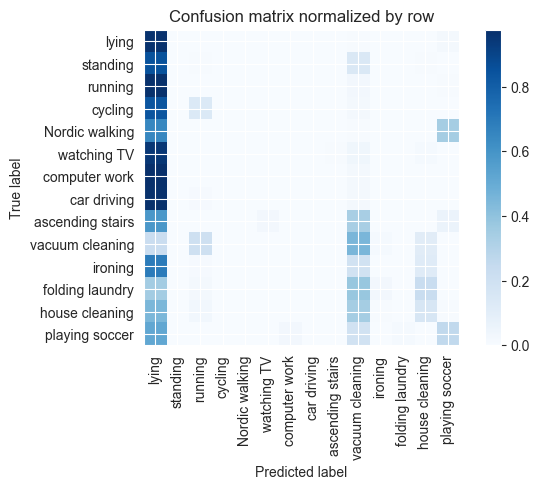

Training Epoch:  93%|█████████▎| 14/15 [06:28<00:29, 29.17s/it]

Overall accuracy: 0.138

                   precision     recall   f1-score rel. freq. abs. freq.|	 biggest thieves

   computer work       0.000      0.000      0.000      0.151        628|	 lying: 0.976,	vacuum cleaning: 0.022,	house cleaning: 0.002,	
         ironing       0.000      0.000      0.000      0.113        469|	 lying: 0.691,	vacuum cleaning: 0.183,	house cleaning: 0.115,	
  Nordic walking       0.000      0.000      0.000      0.092        384|	 lying: 0.648,	playing soccer: 0.344,	vacuum cleaning: 0.005,	
        standing       0.000      0.000      0.000      0.092        382|	 lying: 0.848,	vacuum cleaning: 0.141,	house cleaning: 0.005,	
           lying       0.118      0.967      0.210      0.088        367|	 playing soccer: 0.022,	vacuum cleaning: 0.005,	
  house cleaning       0.291      0.159      0.206      0.087        364|	 lying: 0.448,	vacuum cleaning: 0.343,	
         cycling       0.000      0.000      0.000      0.078        324|	 lying: 0.836,	running: 


train: 100%|██████████| 262/262 [00:29<00:00,  8.88batch/s, loss=0.177, accuracy=0.125]


torch.Size([14, 400])



seen: 100%|██████████| 65/65 [00:02<00:00, 29.35batch/s, loss=0.176]


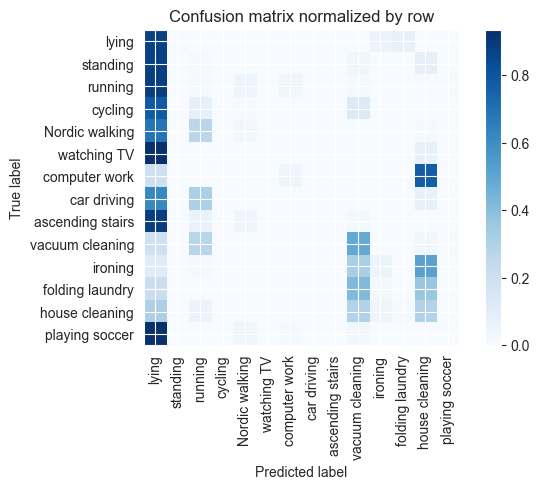

Overall accuracy: 0.152

                   precision     recall   f1-score rel. freq. abs. freq.|	 biggest thieves

   computer work       0.767      0.037      0.070      0.150        626|	 house cleaning: 0.768,	lying: 0.193,	
         ironing       0.371      0.049      0.086      0.114        474|	 house cleaning: 0.517,	vacuum cleaning: 0.314,	lying: 0.112,	
        standing       0.000      0.000      0.000      0.093        387|	 lying: 0.879,	house cleaning: 0.075,	vacuum cleaning: 0.036,	
  Nordic walking       0.312      0.026      0.048      0.093        385|	 lying: 0.686,	running: 0.265,	
  house cleaning       0.110      0.292      0.160      0.088        366|	 lying: 0.306,	vacuum cleaning: 0.295,	
           lying       0.145      0.873      0.249      0.087        363|	 folding laundry: 0.069,	ironing: 0.052,	
         cycling       0.500      0.003      0.006      0.078        325|	 lying: 0.782,	vacuum cleaning: 0.126,	running: 0.080,	
 vacuum cleaning       0.267  

unseen: 100%|██████████| 86/86 [00:02<00:00, 39.08batch/s, loss=0.169]


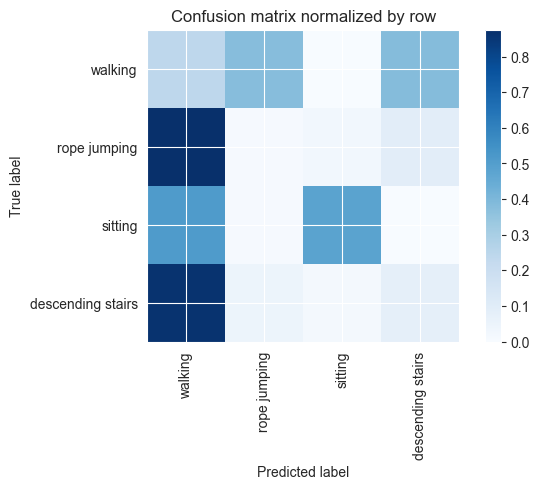

Overall accuracy: 0.271

                    precision     recall   f1-score rel. freq. abs. freq.|	 biggest thieves

          walking       0.207      0.240      0.222      0.421       2316|	 descending stairs: 0.380,	rope jumping: 0.378,	
          sitting       0.966      0.480      0.641      0.325       1787|	 walking: 0.512,	rope jumping: 0.008,	
descending stairs       0.074      0.078      0.076      0.172        945|	 walking: 0.862,	rope jumping: 0.044,	
     rope jumping       0.004      0.009      0.006      0.083        456|	 walking: 0.875,	descending stairs: 0.092,	sitting: 0.024,	

----------------------------------------------------------------------------------------------------
      avg / total       0.414      0.271      0.315        1.0       5504|	      

{'accuracy': 0.27089389534883723, 'precision': 0.3129738203373008, 'recall': 0.2016806497429094, 'f1': 0.2363436185930633}
================ Fold-2 ================
Unseen Classes : ['playing soccer', 'lying', '

Training Epoch:   0%|          | 0/15 [00:00<?, ?it/s]

torch.Size([14, 400])



train: 100%|██████████| 242/242 [00:24<00:00,  9.88batch/s, loss=9.08, accuracy=0.125]


torch.Size([14, 400])



seen: 100%|██████████| 60/60 [00:01<00:00, 40.32batch/s, loss=9.76]


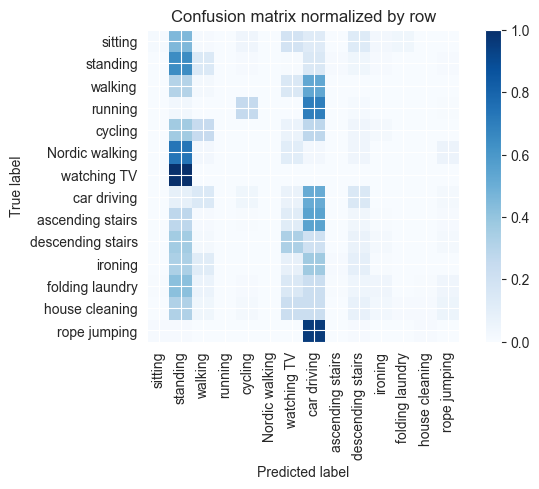

Training Epoch:   7%|▋         | 1/15 [00:26<06:12, 26.61s/it]

Overall accuracy: 0.080

                    precision     recall   f1-score rel. freq. abs. freq.|	 biggest thieves

          ironing       0.070      0.006      0.011      0.126        483|	 car driving: 0.371,	standing: 0.331,	walking: 0.114,	
          walking       0.032      0.017      0.022      0.124        478|	 car driving: 0.529,	standing: 0.305,	watching TV: 0.144,	
          sitting       0.625      0.014      0.027      0.095        366|	 standing: 0.451,	watching TV: 0.180,	descending stairs: 0.123,	
   house cleaning       0.429      0.009      0.017      0.091        348|	 standing: 0.319,	car driving: 0.224,	watching TV: 0.224,	
   Nordic walking       0.000      0.000      0.000      0.091        348|	 standing: 0.733,	watching TV: 0.109,	rope jumping: 0.057,	
         standing       0.141      0.641      0.231      0.089        343|	 car driving: 0.143,	walking: 0.137,	
          cycling       0.000      0.000      0.000      0.084        322|	 standing: 0.360,	car


train: 100%|██████████| 242/242 [00:23<00:00, 10.17batch/s, loss=5.91, accuracy=0.0625]


torch.Size([14, 400])



seen: 100%|██████████| 60/60 [00:01<00:00, 39.03batch/s, loss=4.54]


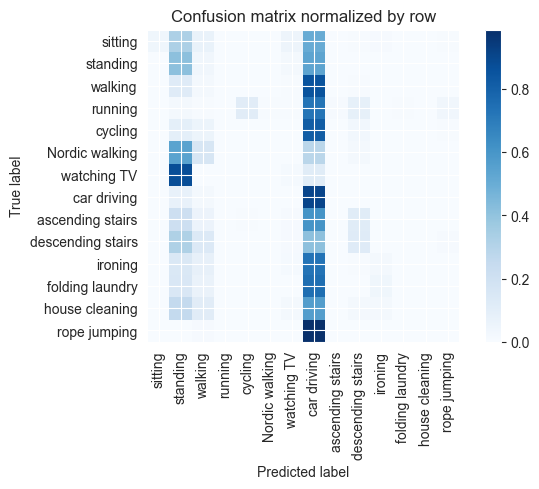

Training Epoch:  13%|█▎        | 2/15 [00:52<05:41, 26.26s/it]

Overall accuracy: 0.078

                    precision     recall   f1-score rel. freq. abs. freq.|	 biggest thieves

          walking       0.033      0.017      0.022      0.125        479|	 car driving: 0.854,	standing: 0.119,	
          ironing       0.345      0.021      0.040      0.124        477|	 car driving: 0.734,	standing: 0.147,	walking: 0.080,	
          sitting       1.000      0.038      0.074      0.095        365|	 car driving: 0.504,	standing: 0.321,	walking: 0.068,	
   house cleaning       0.000      0.000      0.000      0.091        349|	 car driving: 0.564,	standing: 0.252,	walking: 0.112,	
   Nordic walking       0.000      0.000      0.000      0.091        349|	 standing: 0.542,	car driving: 0.284,	walking: 0.158,	
         standing       0.146      0.412      0.216      0.090        347|	 car driving: 0.536,	walking: 0.032,	
          cycling       0.042      0.003      0.006      0.085        325|	 car driving: 0.815,	standing: 0.089,	walking: 0.052,	
 asce


train: 100%|██████████| 242/242 [00:23<00:00, 10.12batch/s, loss=8.25, accuracy=0.0938]


torch.Size([14, 400])



seen: 100%|██████████| 60/60 [00:01<00:00, 36.47batch/s, loss=7.51]


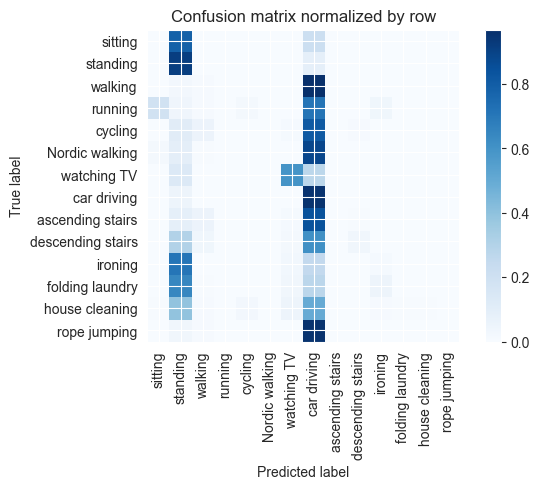

Training Epoch:  20%|██        | 3/15 [01:18<05:14, 26.25s/it]

Overall accuracy: 0.139

                    precision     recall   f1-score rel. freq. abs. freq.|	 biggest thieves

          walking       0.080      0.008      0.015      0.124        478|	 car driving: 0.969,	standing: 0.023,	
          ironing       0.259      0.015      0.028      0.124        476|	 standing: 0.708,	car driving: 0.250,	watching TV: 0.027,	
          sitting       0.000      0.000      0.000      0.096        368|	 standing: 0.785,	car driving: 0.209,	ironing: 0.003,	
   Nordic walking       0.000      0.000      0.000      0.091        350|	 car driving: 0.883,	standing: 0.094,	sitting: 0.017,	
         standing       0.227      0.913      0.363      0.090        346|	 car driving: 0.087,	rope jumping: 0.000,	
   house cleaning       1.000      0.006      0.012      0.090        345|	 car driving: 0.499,	standing: 0.391,	watching TV: 0.046,	
          cycling       0.000      0.000      0.000      0.084        324|	 car driving: 0.812,	standing: 0.108,	walking: 


train: 100%|██████████| 242/242 [00:23<00:00, 10.31batch/s, loss=5.17, accuracy=0.0625]


torch.Size([14, 400])



seen: 100%|██████████| 60/60 [00:01<00:00, 34.41batch/s, loss=2.51]


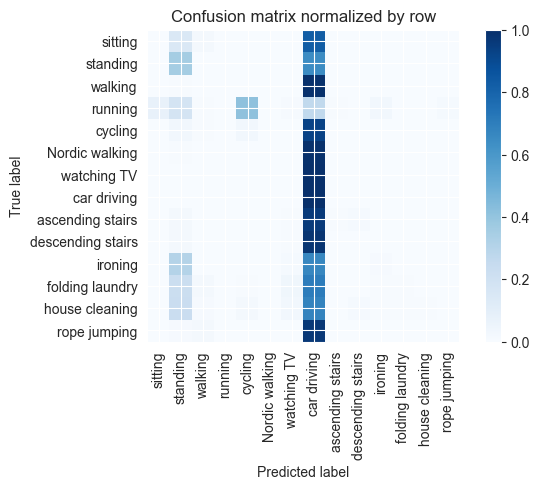

Training Epoch:  27%|██▋       | 4/15 [01:44<04:47, 26.10s/it]

Overall accuracy: 0.064

                    precision     recall   f1-score rel. freq. abs. freq.|	 biggest thieves

          ironing       0.333      0.010      0.020      0.126        483|	 car driving: 0.667,	standing: 0.308,	watching TV: 0.014,	
          walking       0.000      0.000      0.000      0.125        480|	 car driving: 0.994,	standing: 0.006,	rope jumping: 0.000,	
          sitting       0.000      0.000      0.000      0.095        366|	 car driving: 0.828,	standing: 0.145,	walking: 0.019,	
   Nordic walking       0.000      0.000      0.000      0.090        345|	 car driving: 0.994,	standing: 0.006,	rope jumping: 0.000,	
         standing       0.242      0.354      0.287      0.090        345|	 car driving: 0.646,	rope jumping: 0.000,	
   house cleaning       1.000      0.006      0.012      0.090        344|	 car driving: 0.677,	standing: 0.230,	watching TV: 0.029,	
          cycling       0.101      0.031      0.047      0.084        324|	 car driving: 0.929,	


train: 100%|██████████| 242/242 [00:23<00:00, 10.33batch/s, loss=3.02, accuracy=0.0312]


torch.Size([14, 400])



seen: 100%|██████████| 60/60 [00:01<00:00, 36.00batch/s, loss=3.12]


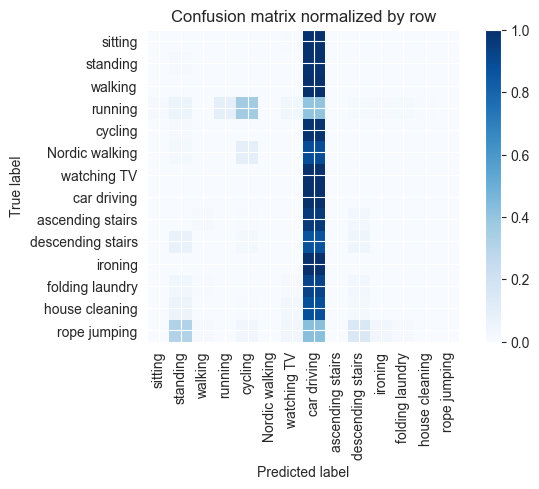

Training Epoch:  33%|███▎      | 5/15 [02:10<04:19, 25.98s/it]

Overall accuracy: 0.035

                    precision     recall   f1-score rel. freq. abs. freq.|	 biggest thieves

          ironing       0.000      0.000      0.000      0.126        483|	 car driving: 0.998,	standing: 0.002,	rope jumping: 0.000,	
          walking       0.000      0.000      0.000      0.124        477|	 car driving: 1.000,	rope jumping: 0.000,	house cleaning: 0.000,	
          sitting       0.000      0.000      0.000      0.096        369|	 car driving: 0.992,	watching TV: 0.005,	descending stairs: 0.003,	
   Nordic walking       0.000      0.000      0.000      0.091        351|	 car driving: 0.889,	cycling: 0.091,	standing: 0.017,	
         standing       0.032      0.009      0.014      0.090        347|	 car driving: 0.991,	rope jumping: 0.000,	
   house cleaning       0.000      0.000      0.000      0.090        344|	 car driving: 0.881,	standing: 0.058,	watching TV: 0.026,	
          cycling       0.000      0.000      0.000      0.084        322|	 car d


train: 100%|██████████| 242/242 [00:24<00:00, 10.05batch/s, loss=1.08, accuracy=0.0312]


torch.Size([14, 400])



seen: 100%|██████████| 60/60 [00:01<00:00, 32.09batch/s, loss=2.45]


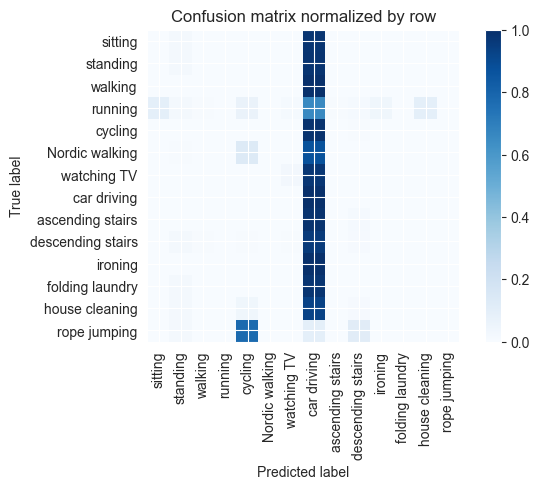

Training Epoch:  40%|████      | 6/15 [02:36<03:55, 26.16s/it]

Overall accuracy: 0.031

                    precision     recall   f1-score rel. freq. abs. freq.|	 biggest thieves

          ironing       0.000      0.000      0.000      0.124        478|	 car driving: 0.998,	standing: 0.002,	rope jumping: 0.000,	
          walking       0.000      0.000      0.000      0.124        478|	 car driving: 1.000,	rope jumping: 0.000,	house cleaning: 0.000,	
          sitting       0.000      0.000      0.000      0.096        368|	 car driving: 0.978,	standing: 0.016,	descending stairs: 0.003,	
   Nordic walking       0.000      0.000      0.000      0.090        347|	 car driving: 0.867,	cycling: 0.127,	standing: 0.006,	
   house cleaning       0.000      0.000      0.000      0.090        346|	 car driving: 0.928,	cycling: 0.038,	standing: 0.023,	
         standing       0.167      0.017      0.032      0.089        343|	 car driving: 0.983,	rope jumping: 0.000,	
          cycling       0.007      0.003      0.004      0.084        322|	 car driving:


train: 100%|██████████| 242/242 [00:24<00:00, 10.01batch/s, loss=1.26, accuracy=0.125]


torch.Size([14, 400])



seen: 100%|██████████| 60/60 [00:01<00:00, 39.96batch/s, loss=0.915]


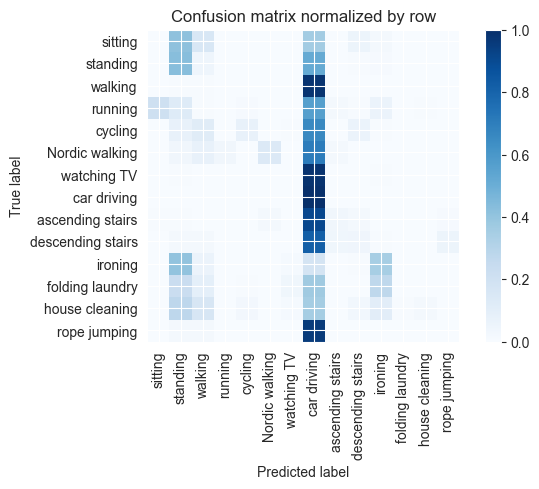

Training Epoch:  47%|████▋     | 7/15 [03:03<03:29, 26.19s/it]

Overall accuracy: 0.134

                    precision     recall   f1-score rel. freq. abs. freq.|	 biggest thieves

          ironing       0.588      0.345      0.434      0.124        476|	 standing: 0.403,	car driving: 0.172,	
          walking       0.012      0.006      0.008      0.124        475|	 car driving: 0.983,	standing: 0.006,	
          sitting       0.000      0.000      0.000      0.095        366|	 standing: 0.413,	car driving: 0.358,	walking: 0.156,	
   Nordic walking       0.887      0.135      0.234      0.091        348|	 car driving: 0.704,	walking: 0.072,	
   house cleaning       0.889      0.023      0.045      0.090        347|	 car driving: 0.352,	standing: 0.277,	walking: 0.159,	
         standing       0.209      0.426      0.281      0.090        345|	 car driving: 0.516,	walking: 0.043,	
          cycling       0.622      0.071      0.127      0.085        325|	 car driving: 0.658,	walking: 0.117,	standing: 0.077,	
 ascending stairs       0.259      0.0


train: 100%|██████████| 242/242 [00:23<00:00, 10.09batch/s, loss=0.219, accuracy=0.109]


torch.Size([14, 400])



seen: 100%|██████████| 60/60 [00:01<00:00, 32.48batch/s, loss=0.222]


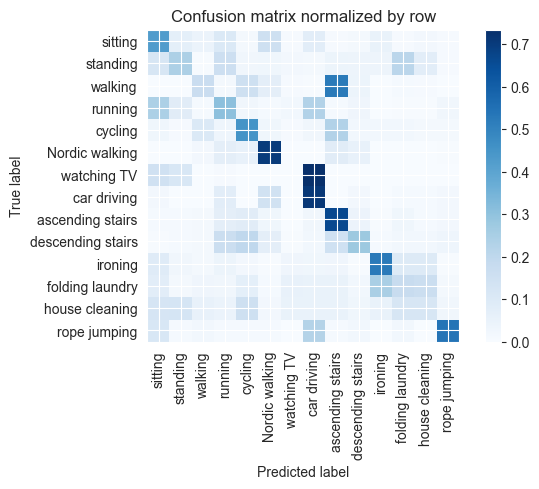

Training Epoch:  53%|█████▎    | 8/15 [03:29<03:03, 26.27s/it]

Overall accuracy: 0.370

                    precision     recall   f1-score rel. freq. abs. freq.|	 biggest thieves

          ironing       0.703      0.524      0.600      0.126        483|	 house cleaning: 0.097,	folding laundry: 0.097,	
          walking       0.447      0.169      0.245      0.123        473|	 ascending stairs: 0.524,	cycling: 0.152,	
          sitting       0.399      0.423      0.411      0.097        371|	 Nordic walking: 0.151,	running: 0.102,	
   Nordic walking       0.615      0.701      0.655      0.091        351|	 ascending stairs: 0.083,	running: 0.071,	
   house cleaning       0.238      0.117      0.157      0.089        341|	 cycling: 0.150,	standing: 0.126,	sitting: 0.123,	
         standing       0.394      0.240      0.299      0.089        341|	 folding laundry: 0.208,	running: 0.155,	
          cycling       0.381      0.453      0.414      0.085        327|	 ascending stairs: 0.229,	walking: 0.101,	
 ascending stairs       0.247      0.664     


train: 100%|██████████| 242/242 [00:24<00:00, 10.04batch/s, loss=0.412, accuracy=0.141]


torch.Size([14, 400])



seen: 100%|██████████| 60/60 [00:01<00:00, 40.37batch/s, loss=0.251]


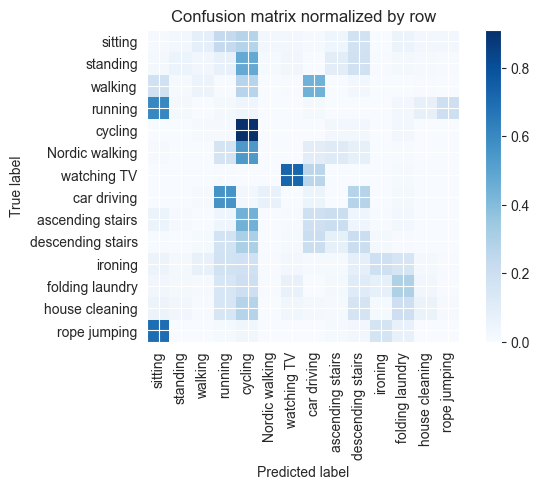

Training Epoch:  60%|██████    | 9/15 [03:55<02:37, 26.20s/it]

Overall accuracy: 0.187

                    precision     recall   f1-score rel. freq. abs. freq.|	 biggest thieves

          ironing       0.687      0.187      0.294      0.125        481|	 cycling: 0.183,	running: 0.175,	
          walking       0.231      0.052      0.085      0.124        477|	 car driving: 0.444,	cycling: 0.270,	sitting: 0.180,	
          sitting       0.009      0.008      0.008      0.096        368|	 cycling: 0.274,	running: 0.231,	descending stairs: 0.171,	
   house cleaning       0.303      0.058      0.097      0.090        347|	 cycling: 0.271,	folding laundry: 0.193,	descending stairs: 0.161,	
   Nordic walking       0.000      0.000      0.000      0.090        346|	 cycling: 0.538,	running: 0.159,	ascending stairs: 0.113,	
         standing       0.322      0.055      0.094      0.090        344|	 cycling: 0.474,	descending stairs: 0.180,	ascending stairs: 0.093,	
          cycling       0.235      0.911      0.374      0.085        326|	 folding laun


train: 100%|██████████| 242/242 [00:23<00:00, 10.10batch/s, loss=0.3, accuracy=0.344]  


torch.Size([14, 400])



seen: 100%|██████████| 60/60 [00:01<00:00, 37.43batch/s, loss=0.277]


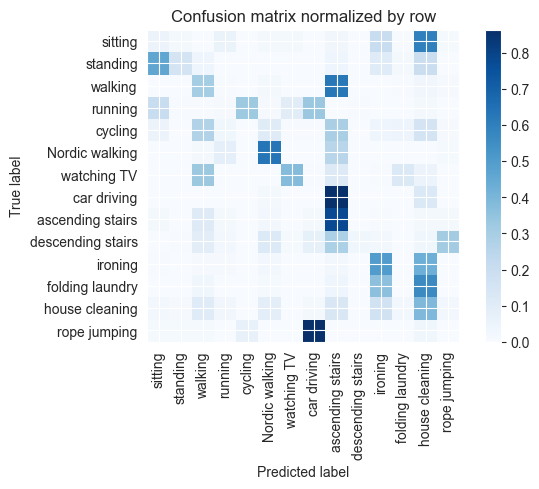

Training Epoch:  67%|██████▋   | 10/15 [04:21<02:11, 26.22s/it]

Overall accuracy: 0.272

                    precision     recall   f1-score rel. freq. abs. freq.|	 biggest thieves

          ironing       0.484      0.500      0.492      0.126        482|	 house cleaning: 0.427,	ascending stairs: 0.027,	
          walking       0.372      0.306      0.336      0.124        477|	 ascending stairs: 0.623,	house cleaning: 0.029,	
          sitting       0.072      0.049      0.058      0.096        367|	 house cleaning: 0.597,	ironing: 0.202,	running: 0.057,	
         standing       0.825      0.150      0.254      0.090        347|	 sitting: 0.461,	house cleaning: 0.196,	
   Nordic walking       0.641      0.630      0.636      0.090        346|	 ascending stairs: 0.251,	running: 0.075,	
   house cleaning       0.161      0.391      0.228      0.090        345|	 ironing: 0.168,	ascending stairs: 0.130,	
          cycling       0.000      0.000      0.000      0.083        320|	 ascending stairs: 0.294,	walking: 0.269,	house cleaning: 0.153,	
 ascend


train: 100%|██████████| 242/242 [00:24<00:00, 10.03batch/s, loss=0.176, accuracy=0.109]


torch.Size([14, 400])



seen: 100%|██████████| 60/60 [00:01<00:00, 37.48batch/s, loss=0.176]


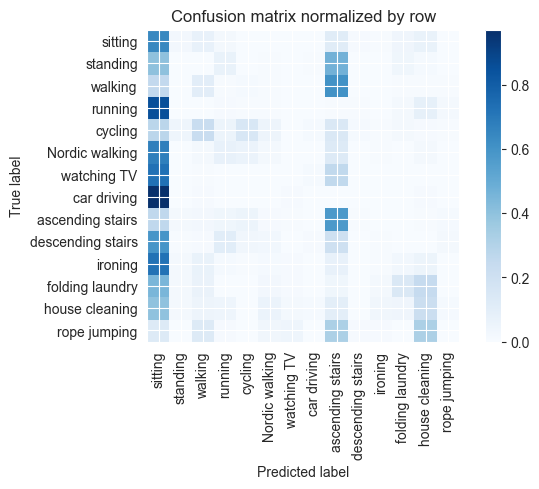

Training Epoch:  73%|███████▎  | 11/15 [04:48<01:44, 26.22s/it]

Overall accuracy: 0.148

                    precision     recall   f1-score rel. freq. abs. freq.|	 biggest thieves

          ironing       0.080      0.004      0.008      0.126        482|	 sitting: 0.722,	ascending stairs: 0.068,	walking: 0.066,	
          walking       0.206      0.100      0.135      0.124        478|	 ascending stairs: 0.607,	sitting: 0.251,	
          sitting       0.120      0.643      0.202      0.095        364|	 ascending stairs: 0.113,	walking: 0.071,	
   house cleaning       0.321      0.216      0.258      0.091        348|	 sitting: 0.397,	ascending stairs: 0.098,	
   Nordic walking       0.088      0.017      0.029      0.090        347|	 sitting: 0.674,	ascending stairs: 0.127,	running: 0.072,	
         standing       0.000      0.000      0.000      0.090        346|	 ascending stairs: 0.468,	sitting: 0.399,	running: 0.066,	
          cycling       0.495      0.150      0.230      0.084        321|	 sitting: 0.274,	walking: 0.224,	
 ascending stairs


train: 100%|██████████| 242/242 [00:23<00:00, 10.25batch/s, loss=0.177, accuracy=0.141]


torch.Size([14, 400])



seen: 100%|██████████| 60/60 [00:01<00:00, 32.88batch/s, loss=0.176]


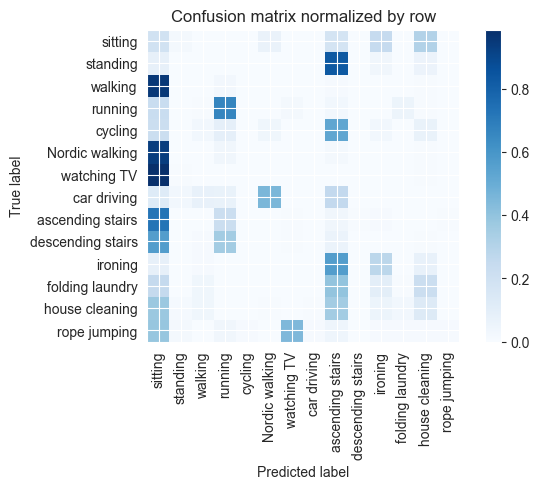

Training Epoch:  80%|████████  | 12/15 [05:14<01:18, 26.13s/it]

Overall accuracy: 0.100

                    precision     recall   f1-score rel. freq. abs. freq.|	 biggest thieves

          ironing       0.463      0.274      0.344      0.124        478|	 ascending stairs: 0.567,	sitting: 0.077,	
          walking       0.021      0.002      0.004      0.124        478|	 sitting: 0.954,	running: 0.025,	ascending stairs: 0.008,	
          sitting       0.041      0.186      0.067      0.095        365|	 house cleaning: 0.307,	ironing: 0.247,	
   house cleaning       0.157      0.127      0.140      0.090        347|	 sitting: 0.375,	ascending stairs: 0.352,	
   Nordic walking       0.000      0.000      0.000      0.090        347|	 sitting: 0.937,	running: 0.032,	ascending stairs: 0.020,	
         standing       0.000      0.000      0.000      0.090        346|	 ascending stairs: 0.829,	sitting: 0.078,	house cleaning: 0.055,	
          cycling       0.000      0.000      0.000      0.085        326|	 ascending stairs: 0.528,	sitting: 0.221,	runn


train: 100%|██████████| 242/242 [00:23<00:00, 10.37batch/s, loss=0.176, accuracy=0.125]


torch.Size([14, 400])



seen: 100%|██████████| 60/60 [00:01<00:00, 33.77batch/s, loss=0.175]


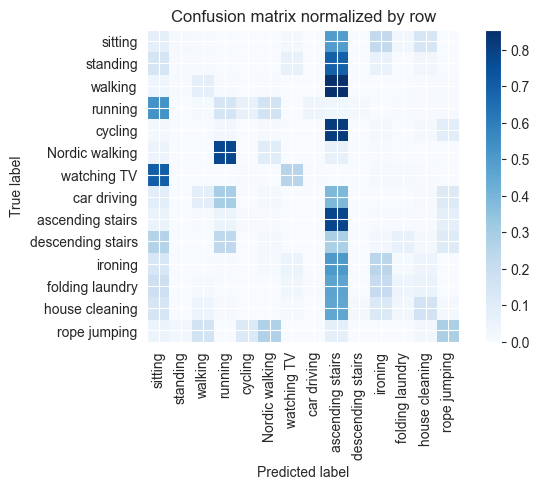

Training Epoch:  87%|████████▋ | 13/15 [05:39<00:51, 25.97s/it]

Overall accuracy: 0.140

                    precision     recall   f1-score rel. freq. abs. freq.|	 biggest thieves

          ironing       0.366      0.242      0.291      0.125        480|	 ascending stairs: 0.506,	sitting: 0.131,	
          walking       0.422      0.074      0.125      0.124        476|	 ascending stairs: 0.855,	sitting: 0.038,	
          sitting       0.049      0.074      0.059      0.096        367|	 ascending stairs: 0.493,	ironing: 0.223,	house cleaning: 0.139,	
   Nordic walking       0.315      0.097      0.148      0.091        351|	 running: 0.775,	ascending stairs: 0.066,	
         standing       0.167      0.006      0.011      0.090        347|	 ascending stairs: 0.692,	sitting: 0.144,	watching TV: 0.066,	
   house cleaning       0.327      0.157      0.212      0.090        344|	 ascending stairs: 0.456,	sitting: 0.142,	
          cycling       0.000      0.000      0.000      0.084        322|	 ascending stairs: 0.817,	rope jumping: 0.093,	running: 


train: 100%|██████████| 242/242 [00:24<00:00, 10.07batch/s, loss=0.195, accuracy=0.188]


torch.Size([14, 400])



seen: 100%|██████████| 60/60 [00:01<00:00, 35.29batch/s, loss=0.178]


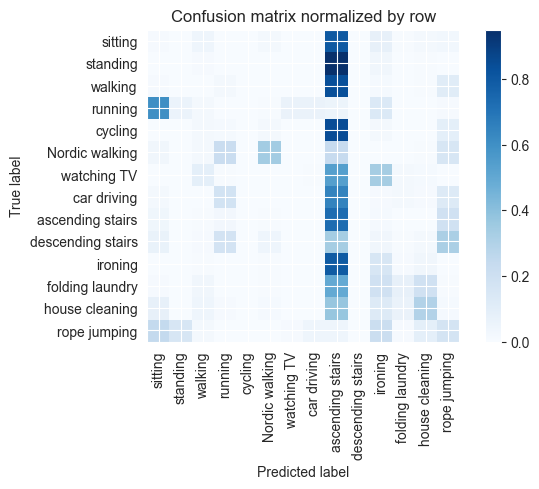

Training Epoch:  93%|█████████▎| 14/15 [06:05<00:26, 26.04s/it]

Overall accuracy: 0.127

                    precision     recall   f1-score rel. freq. abs. freq.|	 biggest thieves

          ironing       0.235      0.153      0.186      0.124        476|	 ascending stairs: 0.792,	house cleaning: 0.032,	
          walking       0.000      0.000      0.000      0.124        475|	 ascending stairs: 0.838,	rope jumping: 0.109,	running: 0.021,	
          sitting       0.019      0.011      0.014      0.095        363|	 ascending stairs: 0.799,	ironing: 0.074,	walking: 0.041,	
   Nordic walking       0.799      0.340      0.477      0.091        350|	 ascending stairs: 0.231,	running: 0.217,	
   house cleaning       0.557      0.294      0.385      0.090        347|	 ascending stairs: 0.375,	ironing: 0.121,	
         standing       0.000      0.000      0.000      0.090        345|	 ascending stairs: 0.951,	ironing: 0.032,	walking: 0.009,	
          cycling       0.000      0.000      0.000      0.085        325|	 ascending stairs: 0.846,	rope jumping:


train: 100%|██████████| 242/242 [00:23<00:00, 10.20batch/s, loss=0.21, accuracy=0.234]


torch.Size([14, 400])



seen: 100%|██████████| 60/60 [00:01<00:00, 36.64batch/s, loss=0.178]


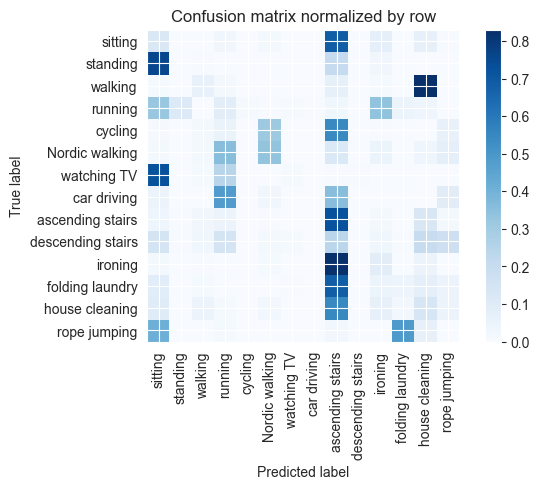

Overall accuracy: 0.121

                    precision     recall   f1-score rel. freq. abs. freq.|	 biggest thieves

          ironing       0.194      0.086      0.119      0.124        477|	 ascending stairs: 0.828,	house cleaning: 0.048,	
          walking       0.382      0.061      0.105      0.124        476|	 house cleaning: 0.830,	ascending stairs: 0.069,	
          sitting       0.071      0.123      0.090      0.095        366|	 ascending stairs: 0.686,	ironing: 0.074,	
   house cleaning       0.079      0.135      0.100      0.091        349|	 ascending stairs: 0.547,	sitting: 0.100,	
   Nordic walking       0.472      0.333      0.391      0.091        348|	 running: 0.353,	ascending stairs: 0.115,	
         standing       0.040      0.003      0.005      0.090        345|	 sitting: 0.754,	ascending stairs: 0.206,	ironing: 0.026,	
          cycling       0.000      0.000      0.000      0.085        326|	 ascending stairs: 0.543,	Nordic walking: 0.310,	rope jumping: 0.064,

unseen: 100%|██████████| 111/111 [00:02<00:00, 43.02batch/s, loss=0.18] 


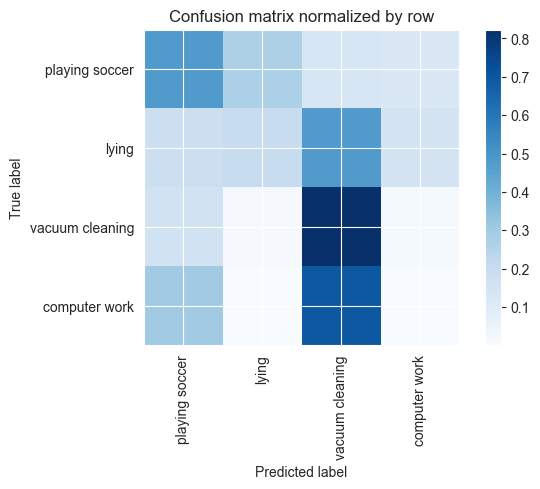

Overall accuracy: 0.281

                  precision     recall   f1-score rel. freq. abs. freq.|	 biggest thieves

  computer work       0.014      0.002      0.003      0.432       3068|	 vacuum cleaning: 0.696,	playing soccer: 0.302,	
          lying       0.729      0.196      0.309      0.264       1876|	 vacuum cleaning: 0.478,	playing soccer: 0.180,	
vacuum cleaning       0.312      0.822      0.452      0.240       1706|	 playing soccer: 0.159,	computer work: 0.011,	
 playing soccer       0.124      0.478      0.197      0.064        454|	 lying: 0.271,	vacuum cleaning: 0.134,	

----------------------------------------------------------------------------------------------------
    avg / total       0.281      0.281      0.204        1.0       7104|	      

{'accuracy': 0.28054617117117114, 'precision': 0.2947103845177882, 'recall': 0.37453922514976623, 'f1': 0.24028030897873584}
================ Fold-3 ================
Unseen Classes : ['cycling', 'running', 'Nordic walking']


Training Epoch:   0%|          | 0/15 [00:00<?, ?it/s]

torch.Size([15, 400])



train: 100%|██████████| 276/276 [00:27<00:00, 10.00batch/s, loss=9.07, accuracy=0.0625]


torch.Size([15, 400])



seen: 100%|██████████| 69/69 [00:02<00:00, 34.24batch/s, loss=6.98]


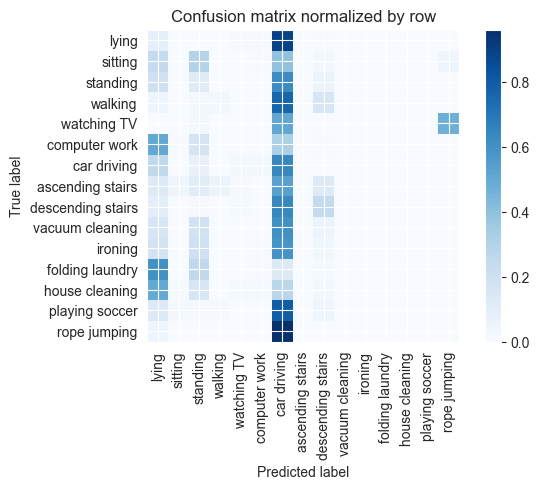

Training Epoch:   7%|▋         | 1/15 [00:30<07:05, 30.41s/it]

Overall accuracy: 0.047

                    precision     recall   f1-score rel. freq. abs. freq.|	 biggest thieves

    computer work       0.000      0.000      0.000      0.138        611|	 lying: 0.506,	car driving: 0.318,	standing: 0.165,	
          ironing       0.000      0.000      0.000      0.113        497|	 car driving: 0.586,	standing: 0.199,	lying: 0.173,	
          walking       0.462      0.027      0.052      0.100        440|	 car driving: 0.761,	descending stairs: 0.155,	lying: 0.039,	
         standing       0.079      0.115      0.094      0.087        384|	 car driving: 0.620,	lying: 0.201,	
            lying       0.032      0.087      0.047      0.086        380|	 car driving: 0.887,	computer work: 0.011,	
          sitting       0.000      0.000      0.000      0.083        365|	 car driving: 0.386,	standing: 0.296,	lying: 0.247,	
  vacuum cleaning       0.000      0.000      0.000      0.079        347|	 car driving: 0.602,	standing: 0.182,	lying: 0.153,	
   


train: 100%|██████████| 276/276 [00:27<00:00,  9.91batch/s, loss=6.73, accuracy=0.0469]


torch.Size([15, 400])



seen: 100%|██████████| 69/69 [00:02<00:00, 29.88batch/s, loss=11.6]


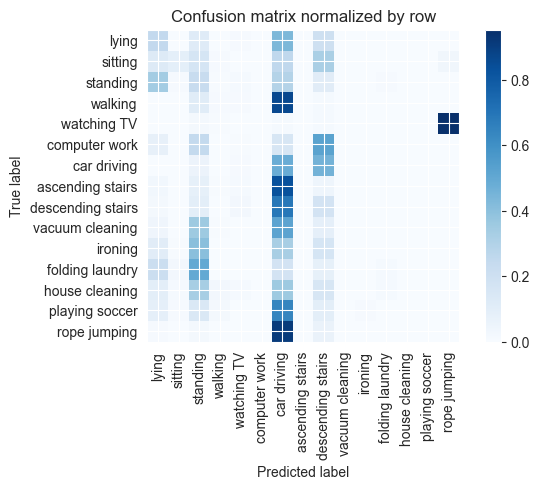

Training Epoch:  13%|█▎        | 2/15 [01:01<06:38, 30.67s/it]

Overall accuracy: 0.069

                    precision     recall   f1-score rel. freq. abs. freq.|	 biggest thieves

    computer work       0.000      0.000      0.000      0.138        611|	 descending stairs: 0.524,	standing: 0.242,	car driving: 0.152,	
          ironing       0.000      0.000      0.000      0.113        498|	 standing: 0.404,	car driving: 0.325,	descending stairs: 0.161,	
          walking       0.167      0.009      0.017      0.100        442|	 car driving: 0.860,	standing: 0.111,	descending stairs: 0.011,	
         standing       0.089      0.226      0.128      0.086        381|	 lying: 0.341,	car driving: 0.291,	
            lying       0.200      0.247      0.221      0.086        380|	 car driving: 0.434,	descending stairs: 0.195,	
          sitting       0.667      0.088      0.155      0.082        364|	 descending stairs: 0.321,	car driving: 0.255,	standing: 0.162,	
  vacuum cleaning       0.000      0.000      0.000      0.079        348|	 car driving:


train: 100%|██████████| 276/276 [00:27<00:00, 10.08batch/s, loss=6.28, accuracy=0.0938]


torch.Size([15, 400])



seen: 100%|██████████| 69/69 [00:02<00:00, 34.27batch/s, loss=6.32]


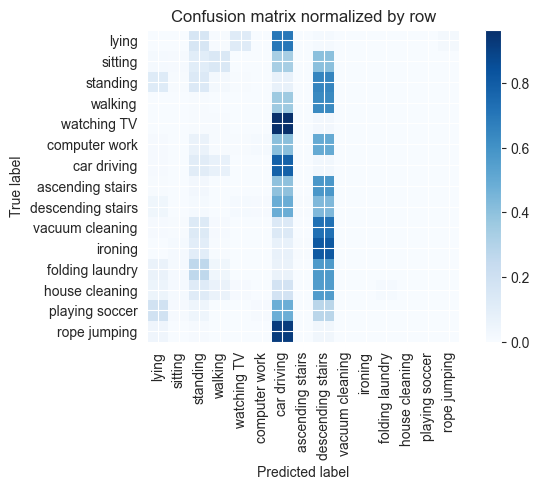

Training Epoch:  20%|██        | 3/15 [01:31<06:04, 30.39s/it]

Overall accuracy: 0.053

                    precision     recall   f1-score rel. freq. abs. freq.|	 biggest thieves

    computer work       0.583      0.012      0.023      0.137        605|	 descending stairs: 0.498,	car driving: 0.410,	standing: 0.061,	
          ironing       0.000      0.000      0.000      0.113        499|	 descending stairs: 0.810,	standing: 0.100,	car driving: 0.068,	
          walking       0.000      0.000      0.000      0.100        443|	 descending stairs: 0.632,	car driving: 0.361,	standing: 0.007,	
         standing       0.129      0.131      0.130      0.087        383|	 descending stairs: 0.645,	lying: 0.117,	
            lying       0.008      0.003      0.004      0.086        379|	 car driving: 0.697,	standing: 0.153,	watching TV: 0.113,	
          sitting       0.143      0.008      0.015      0.083        367|	 descending stairs: 0.403,	car driving: 0.332,	walking: 0.136,	
  vacuum cleaning       0.000      0.000      0.000      0.079        34


train: 100%|██████████| 276/276 [00:27<00:00, 10.18batch/s, loss=2.49, accuracy=0.0312]


torch.Size([15, 400])



seen: 100%|██████████| 69/69 [00:02<00:00, 32.78batch/s, loss=5]   


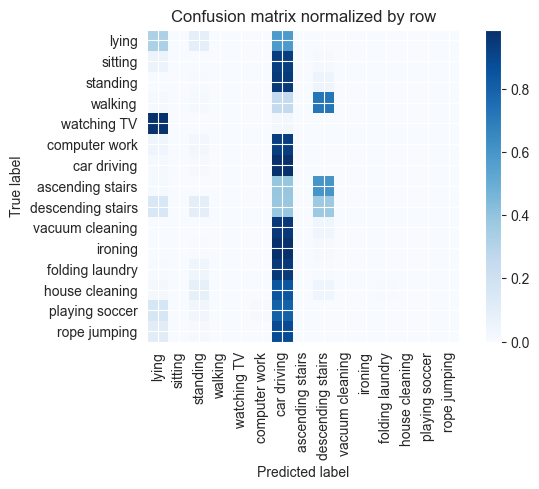

Training Epoch:  27%|██▋       | 4/15 [02:01<05:31, 30.16s/it]

Overall accuracy: 0.070

                    precision     recall   f1-score rel. freq. abs. freq.|	 biggest thieves

    computer work       0.000      0.000      0.000      0.138        608|	 car driving: 0.929,	lying: 0.041,	standing: 0.030,	
          ironing       0.000      0.000      0.000      0.113        499|	 car driving: 0.986,	descending stairs: 0.010,	standing: 0.004,	
          walking       0.000      0.000      0.000      0.099        439|	 descending stairs: 0.722,	car driving: 0.253,	standing: 0.014,	
         standing       0.016      0.005      0.008      0.087        384|	 car driving: 0.945,	descending stairs: 0.049,	
            lying       0.305      0.327      0.316      0.086        379|	 car driving: 0.580,	standing: 0.092,	
          sitting       0.000      0.000      0.000      0.083        367|	 car driving: 0.932,	lying: 0.057,	descending stairs: 0.008,	
  vacuum cleaning       0.000      0.000      0.000      0.079        348|	 car driving: 0.954,	desc


train: 100%|██████████| 276/276 [00:27<00:00, 10.15batch/s, loss=0.918, accuracy=0.0625]


torch.Size([15, 400])



seen: 100%|██████████| 69/69 [00:02<00:00, 31.76batch/s, loss=2.15]


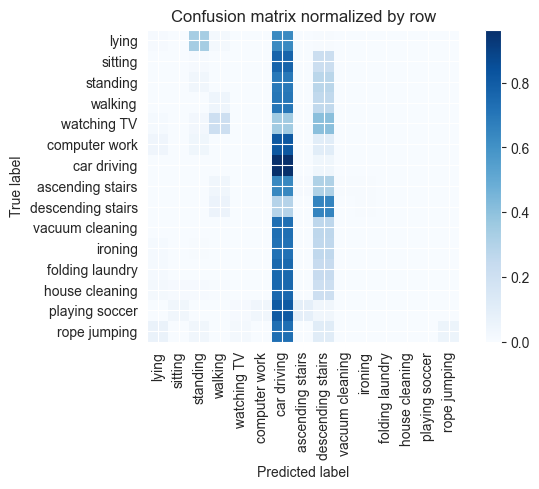

Training Epoch:  33%|███▎      | 5/15 [02:31<05:00, 30.07s/it]

Overall accuracy: 0.063

                    precision     recall   f1-score rel. freq. abs. freq.|	 biggest thieves

    computer work       0.000      0.000      0.000      0.138        610|	 car driving: 0.816,	descending stairs: 0.105,	lying: 0.039,	
          ironing       0.000      0.000      0.000      0.112        495|	 car driving: 0.721,	descending stairs: 0.259,	lying: 0.014,	
          walking       0.237      0.043      0.073      0.100        440|	 car driving: 0.702,	descending stairs: 0.252,	
         standing       0.067      0.031      0.043      0.087        383|	 car driving: 0.692,	descending stairs: 0.277,	
            lying       0.059      0.008      0.014      0.086        380|	 car driving: 0.632,	standing: 0.337,	walking: 0.018,	
          sitting       0.000      0.000      0.000      0.083        367|	 car driving: 0.771,	descending stairs: 0.215,	standing: 0.011,	
  vacuum cleaning       0.000      0.000      0.000      0.079        348|	 car driving: 0.7


train: 100%|██████████| 276/276 [00:27<00:00, 10.04batch/s, loss=2.32, accuracy=0.0938]


torch.Size([15, 400])



seen: 100%|██████████| 69/69 [00:02<00:00, 31.22batch/s, loss=1.69]


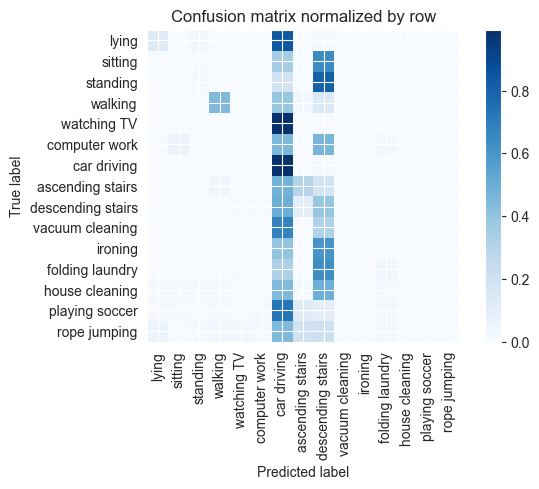

Training Epoch:  40%|████      | 6/15 [03:01<04:31, 30.11s/it]

Overall accuracy: 0.114

                    precision     recall   f1-score rel. freq. abs. freq.|	 biggest thieves

    computer work       0.000      0.000      0.000      0.138        610|	 descending stairs: 0.466,	car driving: 0.451,	sitting: 0.056,	
          ironing       0.000      0.000      0.000      0.113        498|	 descending stairs: 0.602,	car driving: 0.398,	rope jumping: 0.000,	
          walking       0.895      0.444      0.594      0.100        441|	 car driving: 0.390,	descending stairs: 0.138,	
         standing       0.150      0.008      0.015      0.087        384|	 descending stairs: 0.807,	car driving: 0.182,	
            lying       0.780      0.121      0.209      0.086        381|	 car driving: 0.843,	standing: 0.024,	
          sitting       0.000      0.000      0.000      0.083        367|	 descending stairs: 0.643,	car driving: 0.346,	standing: 0.005,	
  vacuum cleaning       0.000      0.000      0.000      0.079        347|	 car driving: 0.674,	des


train: 100%|██████████| 276/276 [00:26<00:00, 10.23batch/s, loss=0.372, accuracy=0.0625]


torch.Size([15, 400])



seen: 100%|██████████| 69/69 [00:02<00:00, 29.74batch/s, loss=0.422]


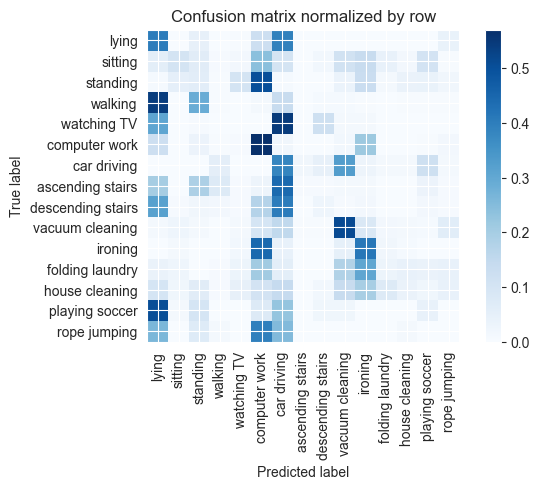

Training Epoch:  47%|████▋     | 7/15 [03:31<04:00, 30.01s/it]

Overall accuracy: 0.229

                    precision     recall   f1-score rel. freq. abs. freq.|	 biggest thieves

    computer work       0.318      0.570      0.408      0.137        607|	 ironing: 0.214,	lying: 0.120,	
          ironing       0.349      0.414      0.378      0.113        498|	 computer work: 0.444,	vacuum cleaning: 0.048,	
          walking       0.029      0.002      0.004      0.100        442|	 lying: 0.541,	standing: 0.287,	car driving: 0.136,	
         standing       0.078      0.060      0.068      0.087        384|	 computer work: 0.503,	ironing: 0.130,	watching TV: 0.102,	
            lying       0.199      0.401      0.266      0.086        379|	 car driving: 0.391,	computer work: 0.121,	
          sitting       0.446      0.101      0.164      0.083        367|	 computer work: 0.240,	ironing: 0.136,	vacuum cleaning: 0.109,	
  vacuum cleaning       0.460      0.511      0.484      0.079        348|	 car driving: 0.149,	computer work: 0.098,	
   house cle


train: 100%|██████████| 276/276 [00:27<00:00, 10.09batch/s, loss=0.251, accuracy=0.203]


torch.Size([15, 400])



seen: 100%|██████████| 69/69 [00:02<00:00, 33.78batch/s, loss=0.34]


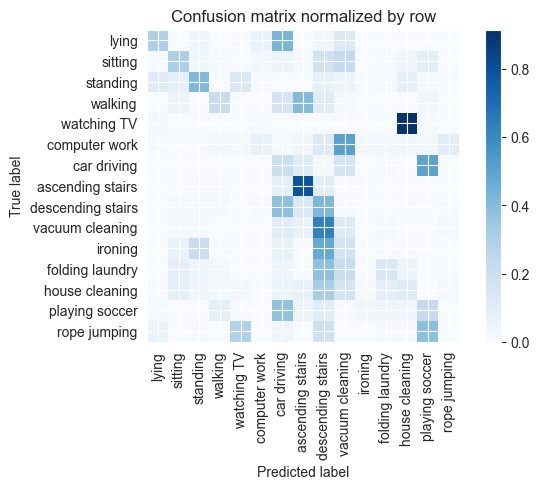

Training Epoch:  53%|█████▎    | 8/15 [04:00<03:29, 29.97s/it]

Overall accuracy: 0.208

                    precision     recall   f1-score rel. freq. abs. freq.|	 biggest thieves

    computer work       0.488      0.069      0.121      0.138        611|	 vacuum cleaning: 0.507,	descending stairs: 0.116,	rope jumping: 0.093,	
          ironing       0.000      0.000      0.000      0.113        498|	 descending stairs: 0.476,	standing: 0.209,	vacuum cleaning: 0.165,	
          walking       0.638      0.219      0.326      0.100        443|	 ascending stairs: 0.404,	car driving: 0.160,	
         standing       0.480      0.411      0.443      0.087        382|	 watching TV: 0.134,	lying: 0.110,	
            lying       0.633      0.300      0.407      0.086        380|	 car driving: 0.429,	vacuum cleaning: 0.124,	
          sitting       0.446      0.307      0.364      0.083        365|	 vacuum cleaning: 0.236,	descending stairs: 0.181,	
  vacuum cleaning       0.057      0.115      0.076      0.079        348|	 descending stairs: 0.629,	car dri


train: 100%|██████████| 276/276 [00:27<00:00, 10.14batch/s, loss=0.191, accuracy=0.109]


torch.Size([15, 400])



seen: 100%|██████████| 69/69 [00:02<00:00, 33.38batch/s, loss=0.175]


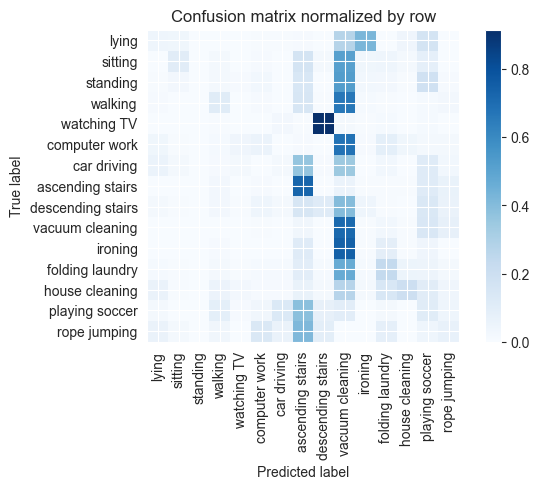

Training Epoch:  60%|██████    | 9/15 [04:30<02:59, 29.91s/it]

Overall accuracy: 0.155

                    precision     recall   f1-score rel. freq. abs. freq.|	 biggest thieves

    computer work       0.391      0.056      0.097      0.138        611|	 vacuum cleaning: 0.682,	folding laundry: 0.083,	
          ironing       0.009      0.004      0.006      0.112        496|	 vacuum cleaning: 0.742,	ascending stairs: 0.109,	folding laundry: 0.087,	
          walking       0.397      0.104      0.165      0.100        441|	 vacuum cleaning: 0.664,	ascending stairs: 0.145,	
         standing       0.250      0.003      0.005      0.087        383|	 vacuum cleaning: 0.525,	playing soccer: 0.180,	ascending stairs: 0.141,	
            lying       0.193      0.042      0.069      0.086        380|	 ironing: 0.424,	vacuum cleaning: 0.274,	playing soccer: 0.163,	
          sitting       0.521      0.101      0.169      0.083        366|	 vacuum cleaning: 0.514,	ascending stairs: 0.158,	
  vacuum cleaning       0.116      0.713      0.200      0.079    


train: 100%|██████████| 276/276 [00:27<00:00, 10.18batch/s, loss=0.198, accuracy=0.188]


torch.Size([15, 400])



seen: 100%|██████████| 69/69 [00:01<00:00, 35.46batch/s, loss=0.18] 


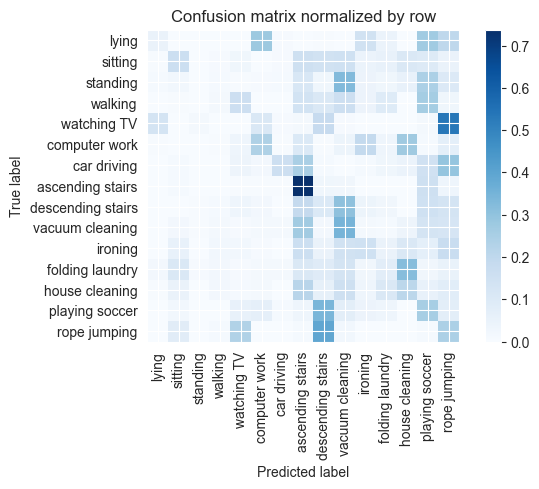

Training Epoch:  67%|██████▋   | 10/15 [05:00<02:29, 29.80s/it]

Overall accuracy: 0.169

                    precision     recall   f1-score rel. freq. abs. freq.|	 biggest thieves

    computer work       0.483      0.239      0.319      0.139        612|	 house cleaning: 0.273,	ironing: 0.188,	
          ironing       0.228      0.149      0.180      0.112        495|	 rope jumping: 0.172,	ascending stairs: 0.160,	
          walking       0.140      0.014      0.025      0.100        443|	 playing soccer: 0.262,	vacuum cleaning: 0.158,	watching TV: 0.156,	
         standing       0.000      0.000      0.000      0.087        384|	 vacuum cleaning: 0.326,	playing soccer: 0.242,	ascending stairs: 0.115,	
            lying       0.333      0.047      0.083      0.086        380|	 computer work: 0.279,	playing soccer: 0.268,	rope jumping: 0.200,	
          sitting       0.397      0.159      0.227      0.083        365|	 ascending stairs: 0.153,	vacuum cleaning: 0.148,	
  vacuum cleaning       0.195      0.346      0.250      0.079        347|	 ascen


train: 100%|██████████| 276/276 [00:27<00:00, 10.17batch/s, loss=0.177, accuracy=0.188]


torch.Size([15, 400])



seen: 100%|██████████| 69/69 [00:01<00:00, 35.74batch/s, loss=0.178]


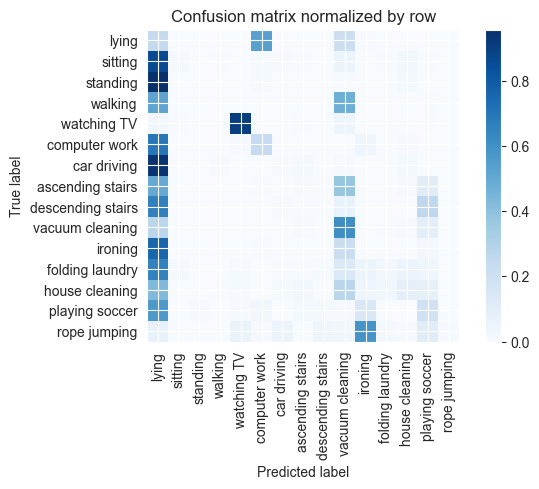

Training Epoch:  73%|███████▎  | 11/15 [05:29<01:59, 29.76s/it]

Overall accuracy: 0.150

                    precision     recall   f1-score rel. freq. abs. freq.|	 biggest thieves

    computer work       0.396      0.238      0.297      0.138        610|	 lying: 0.692,	ironing: 0.041,	
          ironing       0.000      0.000      0.000      0.111        491|	 lying: 0.758,	vacuum cleaning: 0.210,	playing soccer: 0.029,	
          walking       0.000      0.000      0.000      0.100        442|	 lying: 0.518,	vacuum cleaning: 0.473,	playing soccer: 0.005,	
         standing       0.000      0.000      0.000      0.087        384|	 lying: 0.956,	house cleaning: 0.018,	computer work: 0.013,	
            lying       0.036      0.241      0.063      0.086        381|	 computer work: 0.530,	vacuum cleaning: 0.207,	
          sitting       0.538      0.019      0.037      0.083        367|	 lying: 0.856,	vacuum cleaning: 0.052,	house cleaning: 0.027,	
  vacuum cleaning       0.250      0.607      0.355      0.079        349|	 lying: 0.269,	playing socc


train: 100%|██████████| 276/276 [00:26<00:00, 10.27batch/s, loss=0.177, accuracy=0.141]


torch.Size([15, 400])



seen: 100%|██████████| 69/69 [00:02<00:00, 31.36batch/s, loss=0.179]


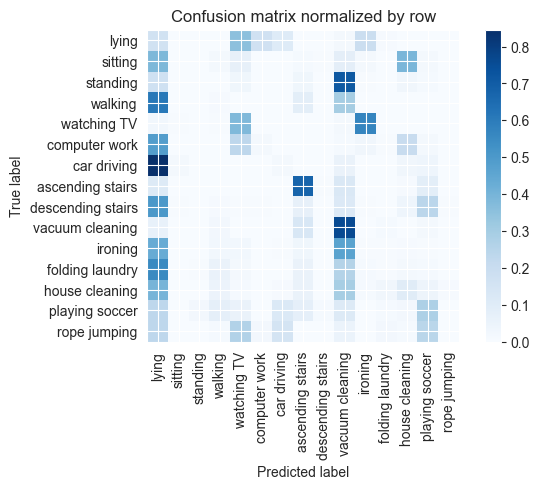

Training Epoch:  80%|████████  | 12/15 [05:59<01:29, 29.71s/it]

Overall accuracy: 0.139

                    precision     recall   f1-score rel. freq. abs. freq.|	 biggest thieves

    computer work       0.139      0.018      0.032      0.138        609|	 lying: 0.484,	watching TV: 0.232,	house cleaning: 0.199,	
          ironing       0.010      0.004      0.006      0.112        496|	 vacuum cleaning: 0.464,	lying: 0.429,	ascending stairs: 0.030,	
          walking       0.044      0.007      0.012      0.100        442|	 lying: 0.611,	vacuum cleaning: 0.294,	ascending stairs: 0.084,	
            lying       0.039      0.160      0.063      0.086        381|	 watching TV: 0.352,	ironing: 0.186,	computer work: 0.168,	
         standing       0.000      0.000      0.000      0.086        380|	 vacuum cleaning: 0.713,	lying: 0.171,	ascending stairs: 0.032,	
          sitting       0.143      0.003      0.005      0.083        367|	 house cleaning: 0.392,	lying: 0.384,	vacuum cleaning: 0.082,	
  vacuum cleaning       0.229      0.759      0.352    


train: 100%|██████████| 276/276 [00:27<00:00, 10.01batch/s, loss=0.244, accuracy=0.234]


torch.Size([15, 400])



seen: 100%|██████████| 69/69 [00:01<00:00, 39.46batch/s, loss=0.177]


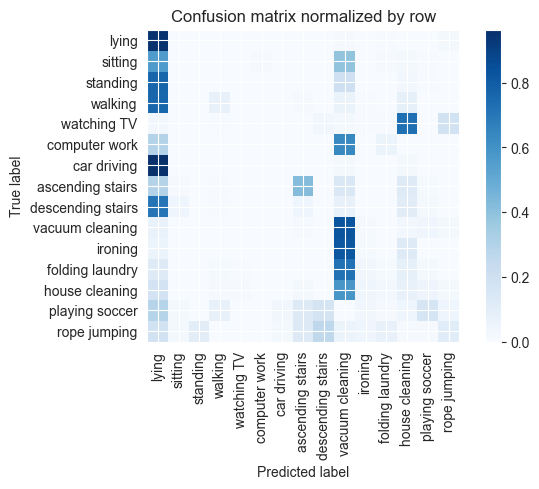

Training Epoch:  87%|████████▋ | 13/15 [06:29<00:59, 29.75s/it]

Overall accuracy: 0.189

                    precision     recall   f1-score rel. freq. abs. freq.|	 biggest thieves

    computer work       0.250      0.003      0.006      0.138        611|	 vacuum cleaning: 0.633,	lying: 0.296,	folding laundry: 0.057,	
          ironing       0.140      0.012      0.022      0.113        497|	 vacuum cleaning: 0.819,	house cleaning: 0.117,	lying: 0.050,	
          walking       0.660      0.075      0.135      0.099        439|	 lying: 0.761,	house cleaning: 0.082,	
         standing       0.000      0.000      0.000      0.087        384|	 lying: 0.766,	vacuum cleaning: 0.198,	house cleaning: 0.029,	
            lying       0.194      0.955      0.323      0.086        380|	 rope jumping: 0.016,	vacuum cleaning: 0.008,	
          sitting       0.000      0.000      0.000      0.083        365|	 lying: 0.564,	vacuum cleaning: 0.386,	house cleaning: 0.022,	
  vacuum cleaning       0.169      0.825      0.281      0.079        349|	 lying: 0.066,	pla


train: 100%|██████████| 276/276 [00:28<00:00,  9.76batch/s, loss=0.175, accuracy=0.359]


torch.Size([15, 400])



seen: 100%|██████████| 69/69 [00:01<00:00, 39.20batch/s, loss=0.175]


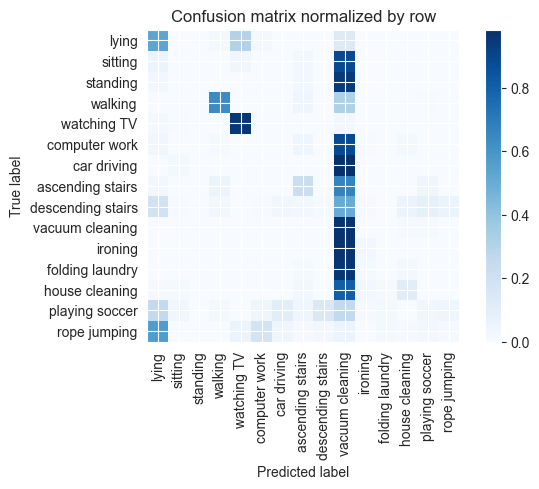

Training Epoch:  93%|█████████▎| 14/15 [06:59<00:30, 30.00s/it]

Overall accuracy: 0.246

                    precision     recall   f1-score rel. freq. abs. freq.|	 biggest thieves

    computer work       0.000      0.000      0.000      0.138        609|	 vacuum cleaning: 0.882,	ascending stairs: 0.043,	lying: 0.031,	
          ironing       0.455      0.030      0.057      0.113        497|	 vacuum cleaning: 0.970,	rope jumping: 0.000,	
          walking       0.895      0.633      0.742      0.100        442|	 vacuum cleaning: 0.314,	ascending stairs: 0.043,	
         standing       0.333      0.003      0.005      0.087        385|	 vacuum cleaning: 0.940,	ascending stairs: 0.029,	lying: 0.026,	
            lying       0.530      0.533      0.532      0.086        379|	 watching TV: 0.306,	vacuum cleaning: 0.124,	
          sitting       0.000      0.000      0.000      0.082        364|	 vacuum cleaning: 0.885,	lying: 0.052,	watching TV: 0.033,	
  vacuum cleaning       0.111      0.968      0.199      0.079        349|	 playing soccer: 0.014,


train: 100%|██████████| 276/276 [00:27<00:00, 10.18batch/s, loss=0.32, accuracy=0.109]


torch.Size([15, 400])



seen: 100%|██████████| 69/69 [00:01<00:00, 35.71batch/s, loss=0.179]


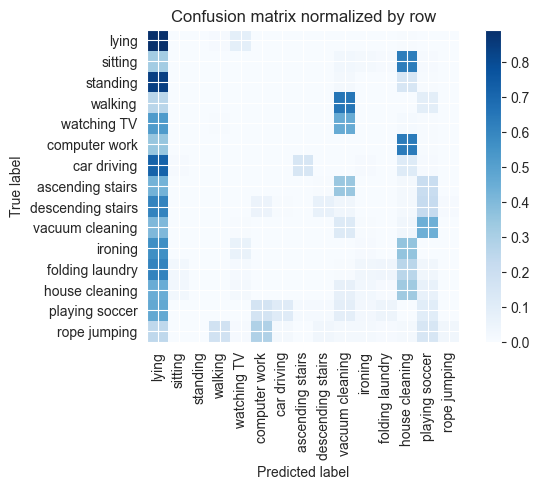

Overall accuracy: 0.119

                    precision     recall   f1-score rel. freq. abs. freq.|	 biggest thieves

    computer work       0.000      0.000      0.000      0.138        608|	 house cleaning: 0.633,	lying: 0.350,	playing soccer: 0.007,	
          ironing       0.147      0.010      0.019      0.113        497|	 lying: 0.567,	house cleaning: 0.358,	watching TV: 0.060,	
          walking       0.045      0.002      0.004      0.100        443|	 vacuum cleaning: 0.648,	lying: 0.257,	playing soccer: 0.090,	
         standing       0.000      0.000      0.000      0.087        384|	 lying: 0.836,	house cleaning: 0.143,	vacuum cleaning: 0.016,	
            lying       0.152      0.892      0.259      0.086        378|	 watching TV: 0.082,	walking: 0.008,	
          sitting       0.000      0.000      0.000      0.083        366|	 house cleaning: 0.626,	lying: 0.317,	vacuum cleaning: 0.025,	
  vacuum cleaning       0.075      0.115      0.091      0.079        349|	 playing 

unseen: 100%|██████████| 68/68 [00:01<00:00, 41.26batch/s, loss=0.196]


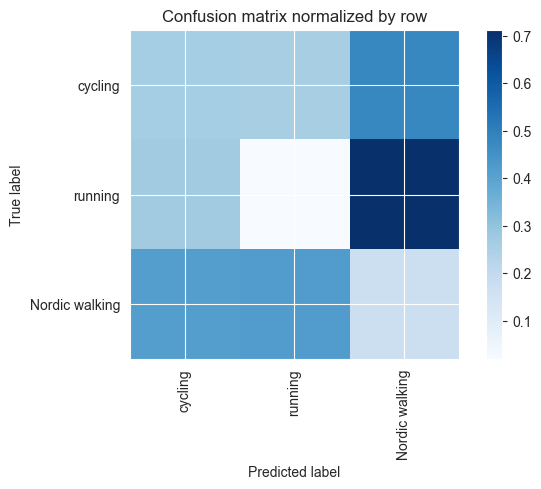

Overall accuracy: 0.171

                 precision     recall   f1-score rel. freq. abs. freq.|	 biggest thieves

Nordic walking       0.178      0.169      0.173      0.419       1824|	 running: 0.418,	cycling: 0.412,	
       cycling       0.294      0.263      0.278      0.365       1587|	 Nordic walking: 0.480,	running: 0.257,	
       running       0.015      0.019      0.017      0.216        941|	 Nordic walking: 0.712,	cycling: 0.269,	

----------------------------------------------------------------------------------------------------
   avg / total       0.185      0.171      0.178        1.0       4352|	      

{'accuracy': 0.17118566176470587, 'precision': 0.16215686228154114, 'recall': 0.15064217515173736, 'f1': 0.15601431521291767}
================ Fold-4 ================
Unseen Classes : ['ironing', 'car driving', 'folding laundry']
per class count :  {'lying': 8, 'sitting': 8, 'standing': 8, 'walking': 8, 'running': 6, 'cycling': 7, 'Nordic walking': 7, 'watching TV': 1,

Training Epoch:   0%|          | 0/15 [00:00<?, ?it/s]

torch.Size([15, 400])



train: 100%|██████████| 283/283 [00:28<00:00, 10.05batch/s, loss=13.2, accuracy=0.125]


torch.Size([15, 400])



seen: 100%|██████████| 70/70 [00:02<00:00, 34.20batch/s, loss=14.6]


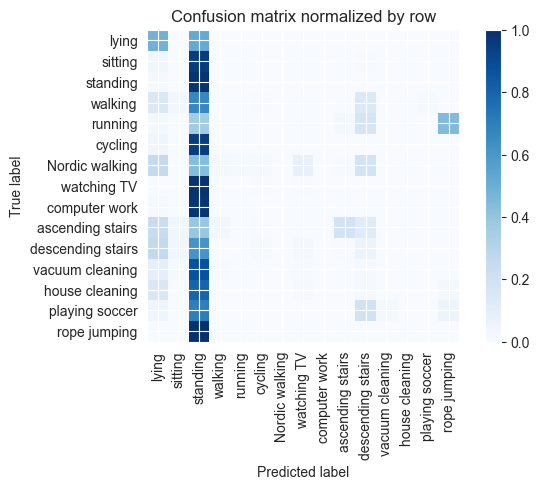

Training Epoch:   7%|▋         | 1/15 [00:30<07:12, 30.87s/it]

Overall accuracy: 0.136

                    precision     recall   f1-score rel. freq. abs. freq.|	 biggest thieves

    computer work       1.000      0.002      0.003      0.135        607|	 standing: 0.982,	lying: 0.015,	
          walking       0.000      0.000      0.000      0.106        475|	 standing: 0.665,	lying: 0.143,	descending stairs: 0.137,	
         standing       0.112      0.987      0.202      0.087        389|	 lying: 0.010,	descending stairs: 0.003,	
   Nordic walking       0.000      0.000      0.000      0.085        383|	 standing: 0.433,	lying: 0.253,	descending stairs: 0.185,	
   house cleaning       0.000      0.000      0.000      0.082        366|	 standing: 0.801,	lying: 0.150,	rope jumping: 0.019,	
            lying       0.310      0.484      0.378      0.081        364|	 standing: 0.514,	ascending stairs: 0.003,	
          sitting       0.000      0.000      0.000      0.078        349|	 standing: 0.951,	lying: 0.037,	descending stairs: 0.006,	
       


train: 100%|██████████| 283/283 [00:27<00:00, 10.14batch/s, loss=7.48, accuracy=0.141]


torch.Size([15, 400])



seen: 100%|██████████| 70/70 [00:02<00:00, 25.84batch/s, loss=3.62]


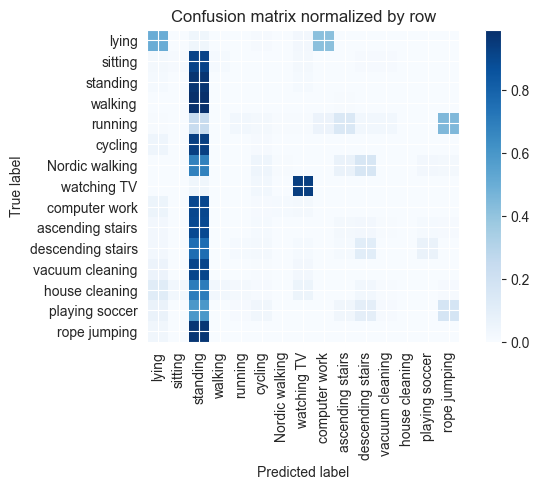

Training Epoch:  13%|█▎        | 2/15 [01:02<06:44, 31.08s/it]

Overall accuracy: 0.163

                    precision     recall   f1-score rel. freq. abs. freq.|	 biggest thieves

    computer work       0.000      0.000      0.000      0.135        604|	 standing: 0.902,	lying: 0.053,	watching TV: 0.022,	
          walking       0.000      0.000      0.000      0.106        475|	 standing: 0.992,	ascending stairs: 0.006,	descending stairs: 0.002,	
         standing       0.113      0.969      0.202      0.087        389|	 lying: 0.015,	watching TV: 0.013,	
   Nordic walking       0.182      0.005      0.010      0.086        385|	 standing: 0.681,	descending stairs: 0.156,	ascending stairs: 0.065,	
            lying       0.569      0.501      0.533      0.083        371|	 computer work: 0.418,	standing: 0.035,	
   house cleaning       0.000      0.000      0.000      0.081        363|	 standing: 0.700,	lying: 0.116,	watching TV: 0.052,	
          sitting       0.188      0.009      0.016      0.078        351|	 standing: 0.917,	lying: 0.023,	wa


train: 100%|██████████| 283/283 [00:28<00:00,  9.81batch/s, loss=7.13, accuracy=0.266]


torch.Size([15, 400])



seen: 100%|██████████| 70/70 [00:02<00:00, 34.60batch/s, loss=3.22]


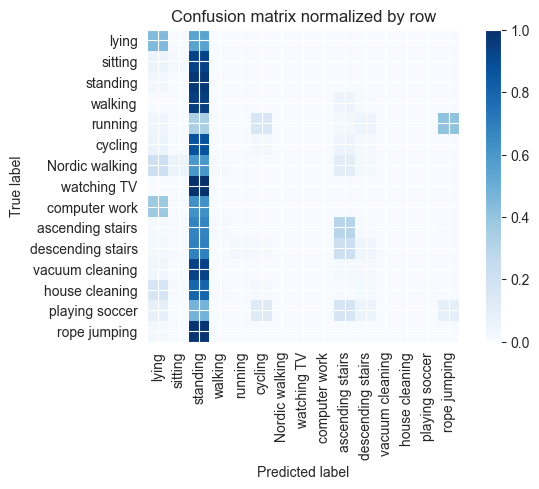

Training Epoch:  20%|██        | 3/15 [01:33<06:14, 31.20s/it]

Overall accuracy: 0.138

                    precision     recall   f1-score rel. freq. abs. freq.|	 biggest thieves

    computer work       0.000      0.000      0.000      0.135        603|	 standing: 0.627,	lying: 0.373,	rope jumping: 0.000,	
          walking       0.000      0.000      0.000      0.107        480|	 standing: 0.948,	ascending stairs: 0.048,	descending stairs: 0.004,	
         standing       0.109      0.972      0.197      0.086        387|	 lying: 0.026,	watching TV: 0.003,	
   Nordic walking       0.000      0.000      0.000      0.085        379|	 standing: 0.599,	lying: 0.214,	ascending stairs: 0.103,	
   house cleaning       0.000      0.000      0.000      0.082        368|	 standing: 0.796,	lying: 0.158,	descending stairs: 0.014,	
            lying       0.268      0.444      0.334      0.082        367|	 standing: 0.550,	ascending stairs: 0.003,	
          sitting       0.125      0.011      0.021      0.078        349|	 standing: 0.928,	lying: 0.054,	
   


train: 100%|██████████| 283/283 [00:29<00:00,  9.59batch/s, loss=2.08, accuracy=0.125]


torch.Size([15, 400])



seen: 100%|██████████| 70/70 [00:02<00:00, 29.72batch/s, loss=5.73]


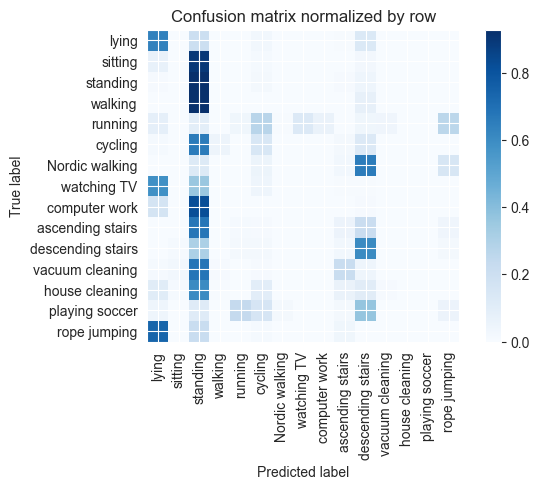

Training Epoch:  27%|██▋       | 4/15 [02:05<05:48, 31.66s/it]

Overall accuracy: 0.171

                    precision     recall   f1-score rel. freq. abs. freq.|	 biggest thieves

    computer work       0.000      0.000      0.000      0.135        604|	 standing: 0.821,	lying: 0.164,	descending stairs: 0.010,	
          walking       0.000      0.000      0.000      0.107        479|	 standing: 0.927,	descending stairs: 0.073,	rope jumping: 0.000,	
         standing       0.134      0.925      0.234      0.087        388|	 descending stairs: 0.041,	cycling: 0.015,	
   Nordic walking       0.250      0.003      0.005      0.085        382|	 descending stairs: 0.654,	rope jumping: 0.149,	standing: 0.118,	
            lying       0.408      0.636      0.497      0.082        368|	 standing: 0.201,	descending stairs: 0.128,	
   house cleaning       0.000      0.000      0.000      0.081        363|	 standing: 0.603,	lying: 0.107,	descending stairs: 0.105,	
          sitting       0.000      0.000      0.000      0.077        347|	 standing: 0.896,	


train: 100%|██████████| 283/283 [00:29<00:00,  9.58batch/s, loss=1.05, accuracy=0.109]


torch.Size([15, 400])



seen: 100%|██████████| 70/70 [00:02<00:00, 26.89batch/s, loss=2.12]


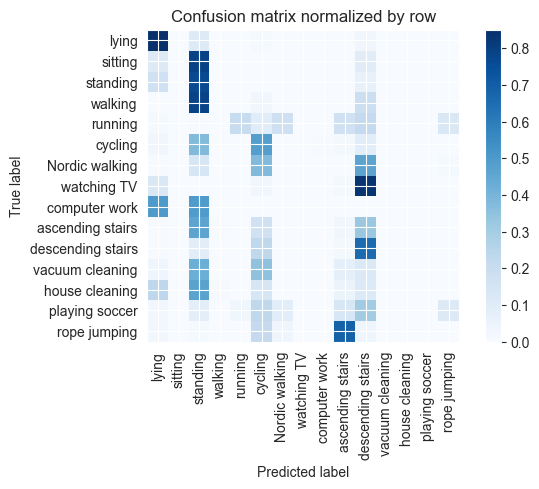

Training Epoch:  33%|███▎      | 5/15 [02:38<05:20, 32.04s/it]

Overall accuracy: 0.208

                    precision     recall   f1-score rel. freq. abs. freq.|	 biggest thieves

    computer work       0.000      0.000      0.000      0.136        608|	 lying: 0.500,	standing: 0.495,	cycling: 0.003,	
          walking       0.000      0.000      0.000      0.107        478|	 standing: 0.787,	descending stairs: 0.184,	cycling: 0.027,	
         standing       0.157      0.766      0.261      0.087        389|	 lying: 0.172,	descending stairs: 0.062,	
   Nordic walking       0.000      0.000      0.000      0.085        383|	 descending stairs: 0.465,	cycling: 0.379,	standing: 0.138,	
            lying       0.366      0.851      0.512      0.082        368|	 standing: 0.106,	descending stairs: 0.027,	
   house cleaning       0.000      0.000      0.000      0.081        365|	 standing: 0.466,	lying: 0.233,	cycling: 0.134,	
          sitting       0.000      0.000      0.000      0.078        348|	 standing: 0.790,	lying: 0.112,	descending stairs:


train: 100%|██████████| 283/283 [00:28<00:00,  9.78batch/s, loss=0.651, accuracy=0.172]


torch.Size([15, 400])



seen: 100%|██████████| 70/70 [00:02<00:00, 33.41batch/s, loss=0.785]


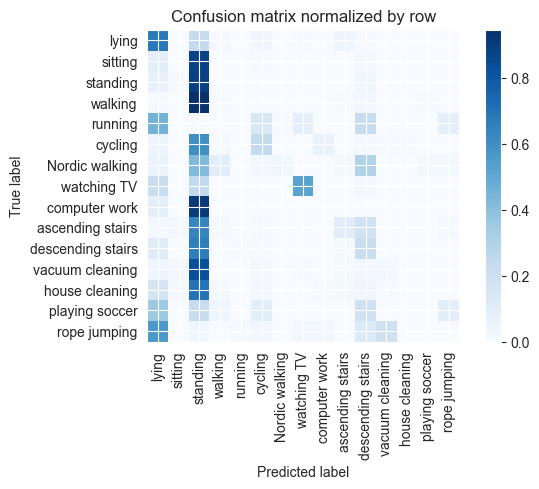

Training Epoch:  40%|████      | 6/15 [03:10<04:47, 31.91s/it]

Overall accuracy: 0.185

                    precision     recall   f1-score rel. freq. abs. freq.|	 biggest thieves

    computer work       0.037      0.002      0.003      0.135        605|	 standing: 0.909,	lying: 0.083,	watching TV: 0.003,	
          walking       0.032      0.004      0.007      0.106        476|	 standing: 0.947,	descending stairs: 0.027,	lying: 0.011,	
         standing       0.117      0.886      0.206      0.086        386|	 lying: 0.067,	descending stairs: 0.034,	
   Nordic walking       0.929      0.034      0.065      0.086        384|	 standing: 0.424,	descending stairs: 0.294,	walking: 0.102,	
            lying       0.360      0.678      0.471      0.082        367|	 standing: 0.232,	ascending stairs: 0.038,	
   house cleaning       0.000      0.000      0.000      0.082        366|	 standing: 0.702,	lying: 0.164,	descending stairs: 0.030,	
          sitting       0.000      0.000      0.000      0.078        348|	 standing: 0.882,	lying: 0.092,	descend


train: 100%|██████████| 283/283 [00:29<00:00,  9.71batch/s, loss=0.218, accuracy=0.0781]


torch.Size([15, 400])



seen: 100%|██████████| 70/70 [00:02<00:00, 32.01batch/s, loss=0.332]


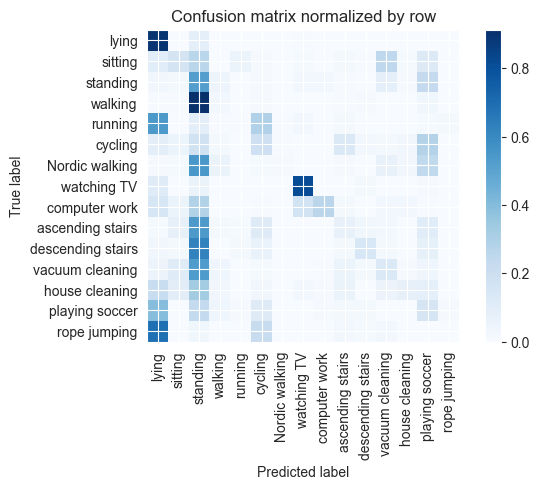

Training Epoch:  47%|████▋     | 7/15 [03:42<04:15, 31.90s/it]

Overall accuracy: 0.235

                    precision     recall   f1-score rel. freq. abs. freq.|	 biggest thieves

    computer work       0.901      0.257      0.399      0.135        604|	 standing: 0.283,	watching TV: 0.171,	
          walking       0.122      0.023      0.039      0.107        479|	 standing: 0.912,	playing soccer: 0.033,	
         standing       0.115      0.519      0.188      0.087        389|	 playing soccer: 0.229,	vacuum cleaning: 0.082,	
   Nordic walking       0.429      0.008      0.015      0.085        381|	 standing: 0.546,	playing soccer: 0.241,	vacuum cleaning: 0.068,	
            lying       0.405      0.896      0.558      0.082        367|	 standing: 0.082,	watching TV: 0.005,	
   house cleaning       0.360      0.074      0.123      0.081        365|	 standing: 0.326,	lying: 0.211,	sitting: 0.093,	
          sitting       0.270      0.162      0.203      0.078        351|	 standing: 0.262,	vacuum cleaning: 0.245,	
          cycling       0.290 


train: 100%|██████████| 283/283 [00:29<00:00,  9.66batch/s, loss=0.179, accuracy=0.0938]


torch.Size([15, 400])



seen: 100%|██████████| 70/70 [00:02<00:00, 31.33batch/s, loss=0.465]


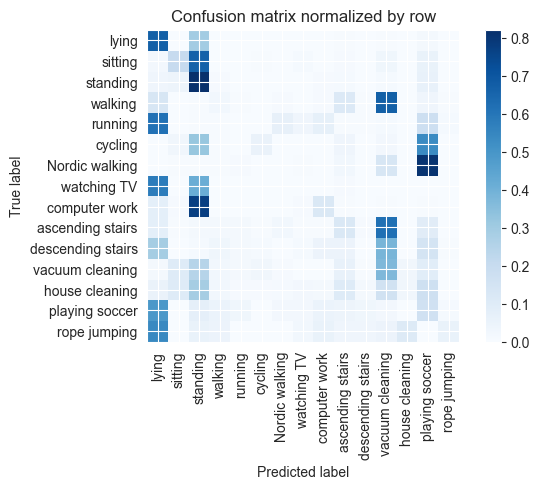

Training Epoch:  53%|█████▎    | 8/15 [04:14<03:43, 31.95s/it]

Overall accuracy: 0.203

                    precision     recall   f1-score rel. freq. abs. freq.|	 biggest thieves

    computer work       0.600      0.119      0.199      0.135        605|	 standing: 0.774,	lying: 0.074,	
          walking       0.200      0.023      0.041      0.108        482|	 vacuum cleaning: 0.670,	lying: 0.131,	ascending stairs: 0.110,	
         standing       0.213      0.822      0.339      0.087        388|	 playing soccer: 0.062,	sitting: 0.039,	
   Nordic walking       0.000      0.000      0.000      0.084        376|	 playing soccer: 0.809,	vacuum cleaning: 0.133,	ascending stairs: 0.024,	
            lying       0.327      0.668      0.439      0.082        368|	 standing: 0.293,	playing soccer: 0.014,	
   house cleaning       0.303      0.027      0.050      0.082        367|	 standing: 0.289,	playing soccer: 0.169,	vacuum cleaning: 0.158,	
          sitting       0.409      0.201      0.270      0.078        348|	 standing: 0.664,	playing soccer: 0.


train: 100%|██████████| 283/283 [00:28<00:00,  9.96batch/s, loss=3.56, accuracy=0.172]  


torch.Size([15, 400])



seen: 100%|██████████| 70/70 [00:02<00:00, 29.37batch/s, loss=0.306]


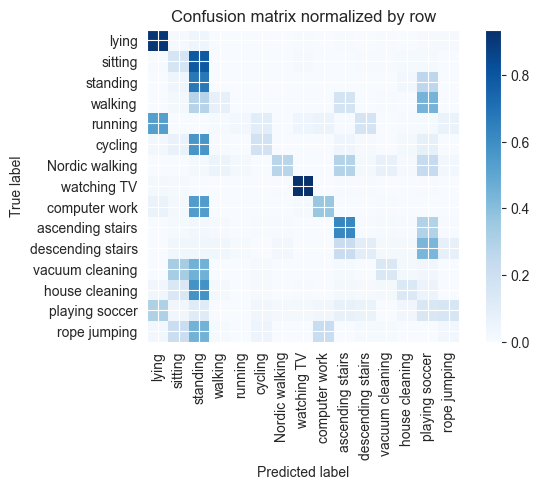

Training Epoch:  60%|██████    | 9/15 [04:45<03:10, 31.75s/it]

Overall accuracy: 0.326

                    precision     recall   f1-score rel. freq. abs. freq.|	 biggest thieves

    computer work       0.867      0.359      0.508      0.134        599|	 standing: 0.541,	lying: 0.060,	
          walking       0.473      0.073      0.127      0.107        478|	 playing soccer: 0.446,	standing: 0.285,	ascending stairs: 0.167,	
         standing       0.162      0.673      0.261      0.087        391|	 playing soccer: 0.258,	sitting: 0.041,	
   Nordic walking       0.920      0.272      0.420      0.085        379|	 ascending stairs: 0.288,	playing soccer: 0.232,	
            lying       0.639      0.913      0.752      0.082        368|	 standing: 0.038,	rope jumping: 0.011,	
   house cleaning       0.522      0.128      0.206      0.082        367|	 standing: 0.580,	sitting: 0.136,	
          sitting       0.185      0.160      0.172      0.078        349|	 standing: 0.788,	playing soccer: 0.014,	
          cycling       0.652      0.182      0.2


train: 100%|██████████| 283/283 [00:29<00:00,  9.56batch/s, loss=0.205, accuracy=0.0469]


torch.Size([15, 400])



seen: 100%|██████████| 70/70 [00:01<00:00, 36.48batch/s, loss=0.176]


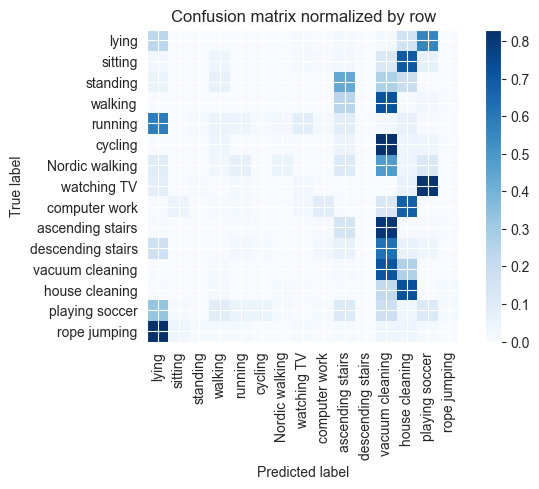

Training Epoch:  67%|██████▋   | 10/15 [05:17<02:39, 31.85s/it]

Overall accuracy: 0.157

                    precision     recall   f1-score rel. freq. abs. freq.|	 biggest thieves

    computer work       0.789      0.093      0.166      0.135        603|	 house cleaning: 0.675,	vacuum cleaning: 0.124,	
          walking       0.011      0.002      0.003      0.107        480|	 vacuum cleaning: 0.723,	ascending stairs: 0.235,	playing soccer: 0.027,	
         standing       0.000      0.000      0.000      0.087        391|	 ascending stairs: 0.432,	vacuum cleaning: 0.269,	house cleaning: 0.182,	
   Nordic walking       0.613      0.049      0.092      0.086        384|	 vacuum cleaning: 0.482,	playing soccer: 0.122,	ascending stairs: 0.112,	
            lying       0.210      0.232      0.221      0.083        370|	 playing soccer: 0.557,	house cleaning: 0.154,	
   house cleaning       0.222      0.726      0.340      0.081        365|	 vacuum cleaning: 0.216,	walking: 0.014,	
          sitting       0.000      0.000      0.000      0.078        3


train: 100%|██████████| 283/283 [00:28<00:00,  9.94batch/s, loss=0.178, accuracy=0.0156]


torch.Size([15, 400])



seen: 100%|██████████| 70/70 [00:01<00:00, 35.13batch/s, loss=0.176]


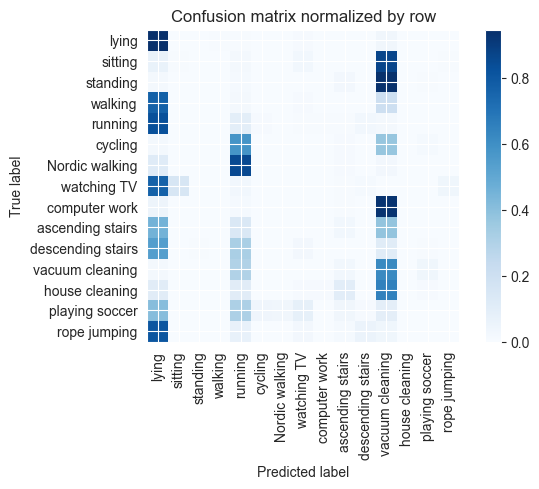

Training Epoch:  73%|███████▎  | 11/15 [05:48<02:06, 31.59s/it]

Overall accuracy: 0.128

                    precision     recall   f1-score rel. freq. abs. freq.|	 biggest thieves

    computer work       0.000      0.000      0.000      0.135        604|	 vacuum cleaning: 0.930,	lying: 0.046,	running: 0.013,	
          walking       0.000      0.000      0.000      0.106        476|	 lying: 0.767,	vacuum cleaning: 0.200,	running: 0.021,	
         standing       0.000      0.000      0.000      0.088        393|	 vacuum cleaning: 0.939,	ascending stairs: 0.023,	lying: 0.018,	
   Nordic walking       0.000      0.000      0.000      0.085        380|	 running: 0.853,	lying: 0.113,	vacuum cleaning: 0.024,	
            lying       0.245      0.946      0.389      0.082        369|	 vacuum cleaning: 0.033,	watching TV: 0.008,	
   house cleaning       1.000      0.003      0.005      0.081        365|	 vacuum cleaning: 0.649,	lying: 0.107,	running: 0.104,	
          sitting       0.087      0.006      0.011      0.077        347|	 vacuum cleaning: 0.86


train: 100%|██████████| 283/283 [00:29<00:00,  9.58batch/s, loss=0.177, accuracy=0.109]


torch.Size([15, 400])



seen: 100%|██████████| 70/70 [00:01<00:00, 38.67batch/s, loss=0.177]


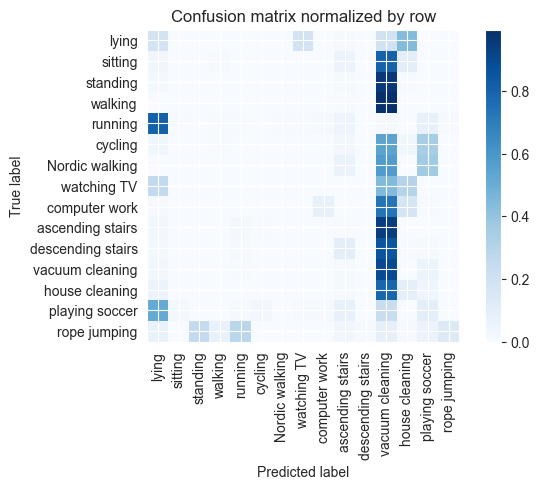

Training Epoch:  80%|████████  | 12/15 [06:20<01:35, 31.74s/it]

Overall accuracy: 0.102

                    precision     recall   f1-score rel. freq. abs. freq.|	 biggest thieves

    computer work       0.939      0.076      0.141      0.135        605|	 vacuum cleaning: 0.732,	house cleaning: 0.170,	
          walking       0.000      0.000      0.000      0.107        480|	 vacuum cleaning: 0.996,	ascending stairs: 0.004,	rope jumping: 0.000,	
         standing       0.000      0.000      0.000      0.087        391|	 vacuum cleaning: 0.962,	lying: 0.018,	ascending stairs: 0.015,	
   Nordic walking       0.000      0.000      0.000      0.085        380|	 vacuum cleaning: 0.574,	playing soccer: 0.363,	ascending stairs: 0.063,	
            lying       0.173      0.181      0.177      0.081        364|	 house cleaning: 0.437,	vacuum cleaning: 0.192,	watching TV: 0.181,	
   house cleaning       0.083      0.088      0.085      0.081        363|	 vacuum cleaning: 0.788,	lying: 0.058,	
          sitting       0.000      0.000      0.000      0.077 


train: 100%|██████████| 283/283 [00:28<00:00,  9.92batch/s, loss=0.18, accuracy=0.125]


torch.Size([15, 400])



seen: 100%|██████████| 70/70 [00:01<00:00, 36.68batch/s, loss=0.177]


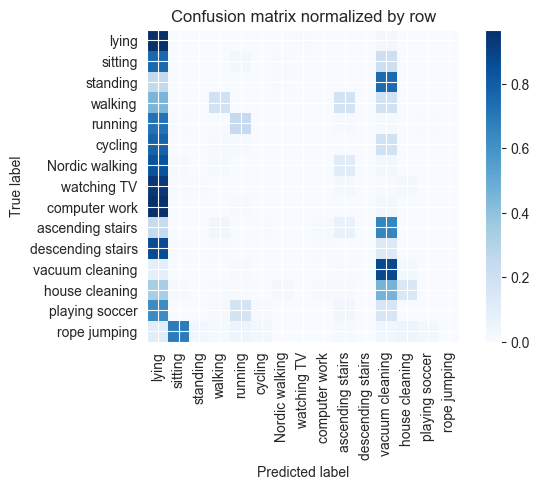

Training Epoch:  87%|████████▋ | 13/15 [06:51<01:02, 31.50s/it]

Overall accuracy: 0.185

                    precision     recall   f1-score rel. freq. abs. freq.|	 biggest thieves

    computer work       0.000      0.000      0.000      0.135        605|	 lying: 0.960,	vacuum cleaning: 0.026,	running: 0.008,	
          walking       0.798      0.183      0.298      0.106        475|	 lying: 0.448,	vacuum cleaning: 0.187,	
         standing       0.000      0.000      0.000      0.087        388|	 vacuum cleaning: 0.745,	lying: 0.250,	Nordic walking: 0.005,	
   Nordic walking       0.000      0.000      0.000      0.085        380|	 lying: 0.837,	ascending stairs: 0.111,	vacuum cleaning: 0.024,	
   house cleaning       0.761      0.139      0.236      0.082        366|	 vacuum cleaning: 0.459,	lying: 0.336,	
            lying       0.127      0.967      0.225      0.081        365|	 vacuum cleaning: 0.025,	watching TV: 0.005,	
          sitting       0.014      0.003      0.005      0.078        348|	 lying: 0.756,	vacuum cleaning: 0.204,	running:


train: 100%|██████████| 283/283 [00:28<00:00,  9.91batch/s, loss=0.177, accuracy=0.0469]


torch.Size([15, 400])



seen: 100%|██████████| 70/70 [00:02<00:00, 30.43batch/s, loss=0.177]


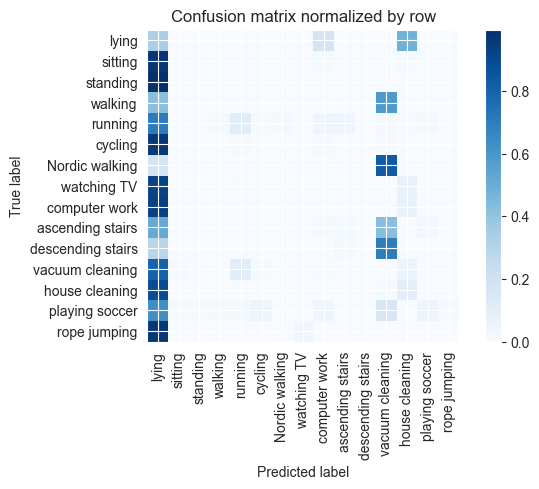

Training Epoch:  93%|█████████▎| 14/15 [07:22<00:31, 31.46s/it]

Overall accuracy: 0.043

                    precision     recall   f1-score rel. freq. abs. freq.|	 biggest thieves

    computer work       0.000      0.000      0.000      0.135        603|	 lying: 0.930,	house cleaning: 0.068,	running: 0.002,	
          walking       0.000      0.000      0.000      0.106        476|	 vacuum cleaning: 0.584,	lying: 0.416,	rope jumping: 0.000,	
         standing       0.000      0.000      0.000      0.086        385|	 lying: 0.995,	house cleaning: 0.003,	cycling: 0.003,	
   Nordic walking       0.000      0.000      0.000      0.085        382|	 vacuum cleaning: 0.825,	lying: 0.175,	rope jumping: 0.000,	
            lying       0.040      0.338      0.071      0.083        370|	 house cleaning: 0.478,	computer work: 0.173,	
   house cleaning       0.121      0.095      0.107      0.082        367|	 lying: 0.883,	vacuum cleaning: 0.014,	
          sitting       0.000      0.000      0.000      0.078        348|	 lying: 0.971,	house cleaning: 0.014,	


train: 100%|██████████| 283/283 [00:29<00:00,  9.67batch/s, loss=0.208, accuracy=0.25]


torch.Size([15, 400])



seen: 100%|██████████| 70/70 [00:02<00:00, 34.09batch/s, loss=0.177]


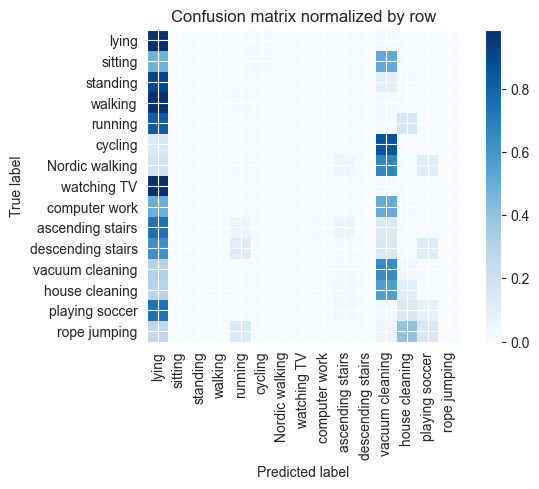

Overall accuracy: 0.140

                    precision     recall   f1-score rel. freq. abs. freq.|	 biggest thieves

    computer work       0.000      0.000      0.000      0.136        609|	 vacuum cleaning: 0.501,	lying: 0.489,	house cleaning: 0.007,	
          walking       0.000      0.000      0.000      0.107        479|	 lying: 0.977,	vacuum cleaning: 0.015,	running: 0.008,	
         standing       0.000      0.000      0.000      0.087        389|	 lying: 0.900,	vacuum cleaning: 0.095,	house cleaning: 0.005,	
   Nordic walking       0.000      0.000      0.000      0.084        375|	 vacuum cleaning: 0.661,	lying: 0.181,	playing soccer: 0.109,	
            lying       0.138      0.978      0.242      0.082        369|	 vacuum cleaning: 0.011,	cycling: 0.005,	
   house cleaning       0.279      0.104      0.152      0.081        364|	 vacuum cleaning: 0.560,	lying: 0.297,	
          sitting       0.000      0.000      0.000      0.078        348|	 vacuum cleaning: 0.514,	lying

unseen: 100%|██████████| 60/60 [00:01<00:00, 41.63batch/s, loss=0.166]


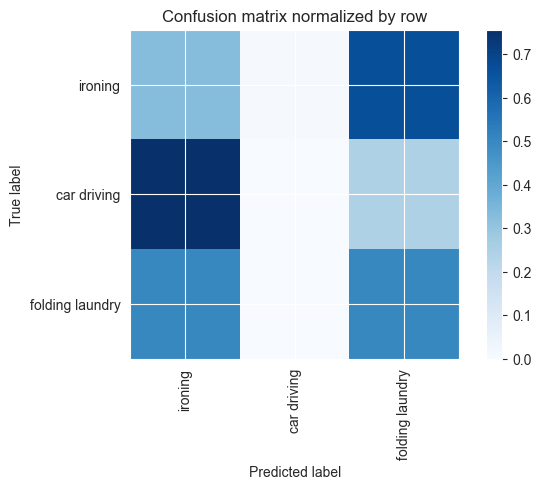

Overall accuracy: 0.324

                  precision     recall   f1-score rel. freq. abs. freq.|	 biggest thieves

        ironing       0.459      0.326      0.381      0.606       2328|	 folding laundry: 0.666,	car driving: 0.008,	
folding laundry       0.225      0.500      0.310      0.254        974|	 ironing: 0.500,	car driving: 0.000,	
    car driving       0.000      0.000      0.000      0.140        538|	 ironing: 0.757,	folding laundry: 0.243,	

----------------------------------------------------------------------------------------------------
    avg / total       0.335      0.324      0.310        1.0       3840|	      

{'accuracy': 0.32447916666666665, 'precision': 0.22789752875376149, 'recall': 0.2753436426116838, 'f1': 0.23040207770236654}
============== Overall Unseen Classes Performance ==============


accuracy     0.259636
precision    0.243456
recall       0.261964
f1           0.218337
dtype: float64

In [37]:
fold_metric_scores = []
for i, cs in enumerate(fold_cls_ids):
    print("="*16, f'Fold-{i}', "="*16)
    print(f'Unseen Classes : {fold_classes[i]}')

    data_dict = dataReader.generate(unseen_classes=cs, seen_ratio=config['seen_split'], unseen_ratio=config['unseen_split'], window_size=5.21, window_overlap=4.21, resample_freq=20)
    all_classes = dataReader.idToLabel
    seen_classes = data_dict['seen_classes']
    unseen_classes = data_dict['unseen_classes']
    print("seen classes > ", seen_classes)
    print("unseen classes > ", unseen_classes)
    train_n, in_ft = data_dict['train']['X'].shape

    print("Initiate IMU datasets ...")
    # build IMU datasets
    train_dt = PAMAP2Dataset(data=data_dict['train']['X'], actions=data_dict['train']['y'], attributes=video_feat, attribute_dict=action_dict, action_classes=seen_classes, seq_len=100)
    train_dl = DataLoader(train_dt, batch_size=config['batch_size'], shuffle=True, pin_memory=True, drop_last=True)
    # build seen eval_dt
    eval_dt = PAMAP2Dataset(data=data_dict['eval-seen']['X'], actions=data_dict['eval-seen']['y'], attributes=video_feat, attribute_dict=action_dict, action_classes=seen_classes, seq_len=100)
    eval_dl = DataLoader(eval_dt, batch_size=config['batch_size'], shuffle=True, pin_memory=True, drop_last=True)
    # build unseen test_dt
    test_dt = PAMAP2Dataset(data=data_dict['test']['X'], actions=data_dict['test']['y'], attributes=video_feat, attribute_dict=action_dict, action_classes=unseen_classes, seq_len=100)
    test_dl = DataLoader(test_dt, batch_size=config['batch_size'], shuffle=True, pin_memory=True, drop_last=True)
    
    # build model
    model = SOTAEmbedding(
        linear_filters=config["model_params"]["linear_filters"],
        input_feat=config["model_params"]["input_feat"],
        dropout=config["model_params"]["dropout"]
    )
    # model = Model1(feat_dim=in_ft, max_len=seq_len, d_model=config['d_model'], n_heads=config['num_heads'], num_layers=2, dim_feedforward=128, ft_size=feat_size)
    model.to(device)
    # define run parameters 
    optimizer = Adam(model.parameters(), lr=config['lr'],weight_decay=1e-5)
    loss_module = {'class': nn.CrossEntropyLoss(reduction="sum"), 'feature': nn.L1Loss(reduction="sum")}
    best_acc = 0.0
    # train the model 
    for epoch in tqdm(range(config['n_epochs']), desc='Training Epoch', leave=False):
        train_metrics = train_step(model, train_dl, train_dt,optimizer, loss_module, device, class_names=[all_classes[i] for i in seen_classes], phase='train', loss_alpha=0.0001)
        eval_metrics = eval_step(model, eval_dl, eval_dt,loss_module, device, class_names=[all_classes[i] for i in seen_classes], phase='seen', print_report=True, loss_alpha=0.0001)
        # print(f"EPOCH [{epoch}] TRAINING : {train_metrics}")
        # print(f"EPOCH [{epoch}] EVAL : {eval_metrics}")
        if eval_metrics['accuracy'] > best_acc:
            best_model = deepcopy(model.state_dict())
    
    # replace by best model 
    model.load_state_dict(best_model)
    save_model(model,notebook_iden,model_iden,i)

    # run evaluation on unseen classes
    test_metrics = eval_step(model, test_dl,test_dt, loss_module, device, class_names=[all_classes[i] for i in unseen_classes],   phase='unseen', loss_alpha=0.0001)
    fold_metric_scores.append(test_metrics)
    print(test_metrics)
    print("="*40)

print("="*14, "Overall Unseen Classes Performance", "="*14)
seen_score_df = pd.DataFrame.from_records(fold_metric_scores)
seen_score_df.mean()
